In [198]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split

from sklearn.preprocessing import StandardScaler

from sklearn.decomposition import IncrementalPCA

from sklearn.decomposition import PCA

import statsmodels.api as sm

from sklearn.linear_model import LogisticRegression

from sklearn import metrics

from sklearn.metrics import precision_recall_curve

from sklearn.model_selection import GridSearchCV

from sklearn.metrics import r2_score

In [2]:
# Suppressing Warnings
import warnings
warnings.filterwarnings('ignore')

In [3]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
pd.set_option('display.expand_frame_repr', False)

##  Data Preparation

In [4]:
df = pd.read_csv(r"D:\AI and ML\Telecom Churn Case Study\telecom_churn_data.csv")

In [5]:
df.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [6]:
df.shape

(99999, 226)

In [7]:
(df.isnull().sum()/len(df))*100 

mobile_number                0.000000
circle_id                    0.000000
loc_og_t2o_mou               1.018010
std_og_t2o_mou               1.018010
loc_ic_t2o_mou               1.018010
last_date_of_month_6         0.000000
last_date_of_month_7         0.601006
last_date_of_month_8         1.100011
last_date_of_month_9         1.659017
arpu_6                       0.000000
arpu_7                       0.000000
arpu_8                       0.000000
arpu_9                       0.000000
onnet_mou_6                  3.937039
onnet_mou_7                  3.859039
onnet_mou_8                  5.378054
onnet_mou_9                  7.745077
offnet_mou_6                 3.937039
offnet_mou_7                 3.859039
offnet_mou_8                 5.378054
offnet_mou_9                 7.745077
roam_ic_mou_6                3.937039
roam_ic_mou_7                3.859039
roam_ic_mou_8                5.378054
roam_ic_mou_9                7.745077
roam_og_mou_6                3.937039
roam_og_mou_

In [8]:
imp_cols = ['total_rech_data_6','total_rech_data_7','total_rech_data_8','total_rech_data_9','max_rech_data_6','max_rech_data_7','max_rech_data_8','max_rech_data_9','av_rech_amt_data_6','av_rech_amt_data_7','av_rech_amt_data_8','av_rech_amt_data_9']

In [9]:
df1 = df.copy()

In [10]:
df1[imp_cols] = df[imp_cols].replace(np.nan, 0)

### 1. Derive new features

 - the first two months - good phase, 
 - the third month - action phase, 
 - and the fourth month - churn phase.

In [11]:
df1['total_avg_rech_amt_GP'] = df1['total_rech_amt_6'] + df1['total_rech_amt_7']

In [12]:
df1['total_avg_rech_amt_GP'] = df1['total_avg_rech_amt_GP']/2

### 2. Filter high-value customers

In [13]:
high_value_cust = df1['total_avg_rech_amt_GP'].quantile(0.7)

In [14]:
df_high_value_cust = df1[df1['total_avg_rech_amt_GP'] > high_value_cust]

In [15]:
df_high_value_cust.shape

(29979, 227)

### 3. Tag churners and remove attributes of the churn phase

In [16]:
churn_tag_attributes = ['total_ic_mou_9','total_og_mou_9','vol_2g_mb_9','vol_3g_mb_9']

In [17]:
df_high_value_cust[churn_tag_attributes].isnull().sum()

total_ic_mou_9    0
total_og_mou_9    0
vol_2g_mb_9       0
vol_3g_mb_9       0
dtype: int64

In [18]:
df_high_value_cust['churn'] = 0

In [19]:
is_churned = ((df_high_value_cust['total_ic_mou_9'] == 0) & (df_high_value_cust['total_og_mou_9'] == 0) & (df_high_value_cust['vol_2g_mb_9'] == 0) & (df_high_value_cust['vol_3g_mb_9'] == 0))

In [20]:
df_high_value_cust[is_churned]['churn']

7        0
97       0
111      0
143      0
188      0
        ..
99827    0
99868    0
99885    0
99887    0
99961    0
Name: churn, Length: 2589, dtype: int64

In [21]:
df_high_value_cust.loc[is_churned,'churn']=1

In [22]:
100*(df_high_value_cust.churn.sum()/len(df_high_value_cust))

8.636045231662164

In [23]:
df_high_value_cust['churn'].value_counts()

0    27390
1     2589
Name: churn, dtype: int64

After tagging churners, remove all the attributes corresponding to the churn phase (all attributes having ‘ _9’, etc., in their names).

In [24]:
churn_month_columns = []

In [25]:
columns_list = list(df_high_value_cust.columns)
for i in columns_list:
    if ('_9' in i):
        churn_month_columns.append(i)

In [26]:
churn_month_columns

['last_date_of_month_9',
 'arpu_9',
 'onnet_mou_9',
 'offnet_mou_9',
 'roam_ic_mou_9',
 'roam_og_mou_9',
 'loc_og_t2t_mou_9',
 'loc_og_t2m_mou_9',
 'loc_og_t2f_mou_9',
 'loc_og_t2c_mou_9',
 'loc_og_mou_9',
 'std_og_t2t_mou_9',
 'std_og_t2m_mou_9',
 'std_og_t2f_mou_9',
 'std_og_t2c_mou_9',
 'std_og_mou_9',
 'isd_og_mou_9',
 'spl_og_mou_9',
 'og_others_9',
 'total_og_mou_9',
 'loc_ic_t2t_mou_9',
 'loc_ic_t2m_mou_9',
 'loc_ic_t2f_mou_9',
 'loc_ic_mou_9',
 'std_ic_t2t_mou_9',
 'std_ic_t2m_mou_9',
 'std_ic_t2f_mou_9',
 'std_ic_t2o_mou_9',
 'std_ic_mou_9',
 'total_ic_mou_9',
 'spl_ic_mou_9',
 'isd_ic_mou_9',
 'ic_others_9',
 'total_rech_num_9',
 'total_rech_amt_9',
 'max_rech_amt_9',
 'date_of_last_rech_9',
 'last_day_rch_amt_9',
 'date_of_last_rech_data_9',
 'total_rech_data_9',
 'max_rech_data_9',
 'count_rech_2g_9',
 'count_rech_3g_9',
 'av_rech_amt_data_9',
 'vol_2g_mb_9',
 'vol_3g_mb_9',
 'arpu_3g_9',
 'arpu_2g_9',
 'night_pck_user_9',
 'monthly_2g_9',
 'sachet_2g_9',
 'monthly_3g_9',
 

In [27]:
df_high_value_cust.drop(churn_month_columns, axis = 1, inplace = True)

## Modelling

### 1. Preprocess data

In [28]:
df_high_value_cust.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29979 entries, 7 to 99997
Columns: 174 entries, mobile_number to churn
dtypes: float64(137), int64(28), object(9)
memory usage: 40.0+ MB


In [29]:
date_cols = list(df_high_value_cust.select_dtypes('object').columns)

In [30]:
for i in date_cols:
    df_high_value_cust[i] = pd.to_datetime(df_high_value_cust[i])

In [31]:
df_high_value_cust[date_cols].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29979 entries, 7 to 99997
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   last_date_of_month_6      29979 non-null  datetime64[ns]
 1   last_date_of_month_7      29948 non-null  datetime64[ns]
 2   last_date_of_month_8      29822 non-null  datetime64[ns]
 3   date_of_last_rech_6       29917 non-null  datetime64[ns]
 4   date_of_last_rech_7       29865 non-null  datetime64[ns]
 5   date_of_last_rech_8       29385 non-null  datetime64[ns]
 6   date_of_last_rech_data_6  11387 non-null  datetime64[ns]
 7   date_of_last_rech_data_7  11652 non-null  datetime64[ns]
 8   date_of_last_rech_data_8  11741 non-null  datetime64[ns]
dtypes: datetime64[ns](9)
memory usage: 2.3 MB


In [32]:
((df_high_value_cust.isnull().sum())/len(df_high_value_cust))*100

mobile_number                0.000000
circle_id                    0.000000
loc_og_t2o_mou               0.380266
std_og_t2o_mou               0.380266
loc_ic_t2o_mou               0.380266
last_date_of_month_6         0.000000
last_date_of_month_7         0.103406
last_date_of_month_8         0.523700
arpu_6                       0.000000
arpu_7                       0.000000
arpu_8                       0.000000
onnet_mou_6                  1.054071
onnet_mou_7                  1.010707
onnet_mou_8                  3.128857
offnet_mou_6                 1.054071
offnet_mou_7                 1.010707
offnet_mou_8                 3.128857
roam_ic_mou_6                1.054071
roam_ic_mou_7                1.010707
roam_ic_mou_8                3.128857
roam_og_mou_6                1.054071
roam_og_mou_7                1.010707
roam_og_mou_8                3.128857
loc_og_t2t_mou_6             1.054071
loc_og_t2t_mou_7             1.010707
loc_og_t2t_mou_8             3.128857
loc_og_t2m_m

In [33]:
remove_cols = ['date_of_last_rech_data_6','date_of_last_rech_data_7','date_of_last_rech_data_8','count_rech_2g_6','count_rech_2g_7','count_rech_2g_8','count_rech_3g_6','count_rech_3g_7','count_rech_3g_8','arpu_3g_6','arpu_3g_7','arpu_3g_8','arpu_2g_6','arpu_2g_7','arpu_2g_8','night_pck_user_6','night_pck_user_7','night_pck_user_8','fb_user_6','fb_user_7','fb_user_8']

In [34]:
df_high_value_cust.drop(remove_cols, axis =1 , inplace = True)

In [35]:
((df_high_value_cust.isnull().sum())/len(df_high_value_cust))*100

mobile_number            0.000000
circle_id                0.000000
loc_og_t2o_mou           0.380266
std_og_t2o_mou           0.380266
loc_ic_t2o_mou           0.380266
last_date_of_month_6     0.000000
last_date_of_month_7     0.103406
last_date_of_month_8     0.523700
arpu_6                   0.000000
arpu_7                   0.000000
arpu_8                   0.000000
onnet_mou_6              1.054071
onnet_mou_7              1.010707
onnet_mou_8              3.128857
offnet_mou_6             1.054071
offnet_mou_7             1.010707
offnet_mou_8             3.128857
roam_ic_mou_6            1.054071
roam_ic_mou_7            1.010707
roam_ic_mou_8            3.128857
roam_og_mou_6            1.054071
roam_og_mou_7            1.010707
roam_og_mou_8            3.128857
loc_og_t2t_mou_6         1.054071
loc_og_t2t_mou_7         1.010707
loc_og_t2t_mou_8         3.128857
loc_og_t2m_mou_6         1.054071
loc_og_t2m_mou_7         1.010707
loc_og_t2m_mou_8         3.128857
loc_og_t2f_mou

In [36]:
df_high_value_cust.shape

(29979, 153)

In [37]:
df_high_value_cust.dropna(inplace = True)

In [38]:
df_high_value_cust.shape

(28455, 153)

### 2. EDA

In [39]:
remove_cols = []

In [40]:
remove_cols1 = []

In [41]:
list(df_high_value_cust.select_dtypes('int').columns)

['mobile_number',
 'circle_id',
 'total_rech_num_6',
 'total_rech_num_7',
 'total_rech_num_8',
 'total_rech_amt_6',
 'total_rech_amt_7',
 'total_rech_amt_8',
 'max_rech_amt_6',
 'max_rech_amt_7',
 'max_rech_amt_8',
 'last_day_rch_amt_6',
 'last_day_rch_amt_7',
 'last_day_rch_amt_8',
 'monthly_2g_6',
 'monthly_2g_7',
 'monthly_2g_8',
 'sachet_2g_6',
 'sachet_2g_7',
 'sachet_2g_8',
 'monthly_3g_6',
 'monthly_3g_7',
 'monthly_3g_8',
 'sachet_3g_6',
 'sachet_3g_7',
 'sachet_3g_8',
 'aon',
 'churn']

In [42]:
df_high_value_cust['circle_id'].value_counts()

109    28455
Name: circle_id, dtype: int64

In [43]:
remove_cols.append('circle_id')

In [44]:
def box_plot(attributes):
    plt.figure(figsize=(20,16))
    plt.subplot(2,3,1)
    sns.boxplot(data = df_high_value_cust, y = attributes + '_6' , x = 'churn', hue = 'churn', showfliers = False)
    
    plt.subplot(2,3,2)
    sns.boxplot(data = df_high_value_cust, y = attributes + '_7' , x = 'churn', hue = 'churn', showfliers = False)
    
    plt.subplot(2,3,3)
    sns.boxplot(data = df_high_value_cust, y = attributes + '_8' , x = 'churn', hue = 'churn', showfliers = False)
    
    plt.show()

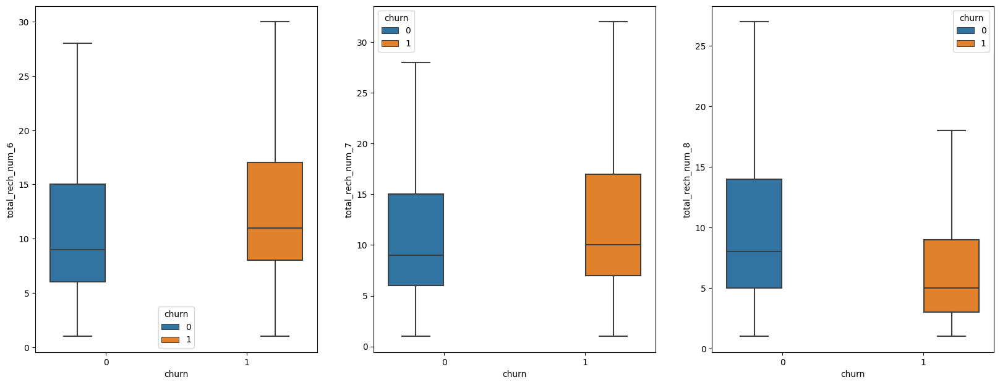

In [45]:
box_plot('total_rech_num')

> We can observe a decrease in recharge numbers in 8th month.

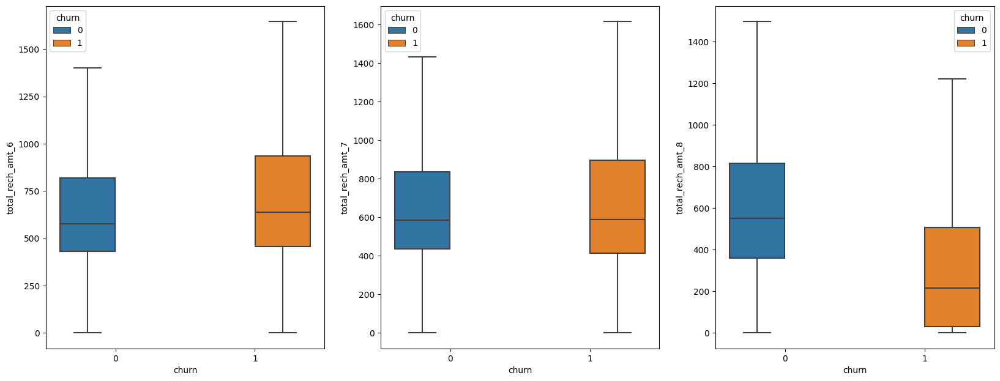

In [46]:
box_plot('total_rech_amt')

> We can observe a decrease in total recharge amount in 8th month.

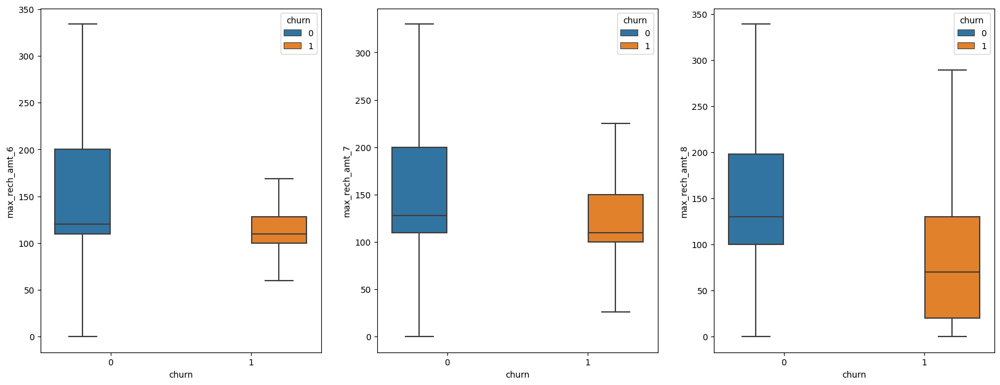

In [47]:
box_plot('max_rech_amt')

> We can observe a decrease in maximum recharge amount in 8th month.

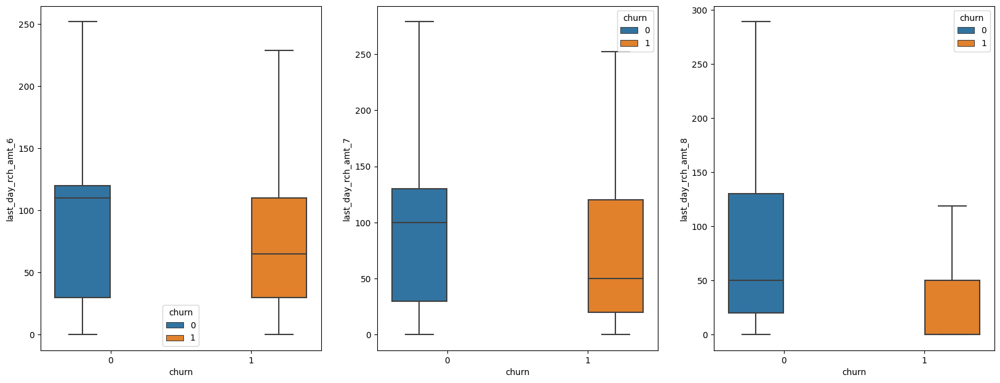

In [48]:
box_plot('last_day_rch_amt')

> We can observe a decrease in last day recharge amount in 8th month.

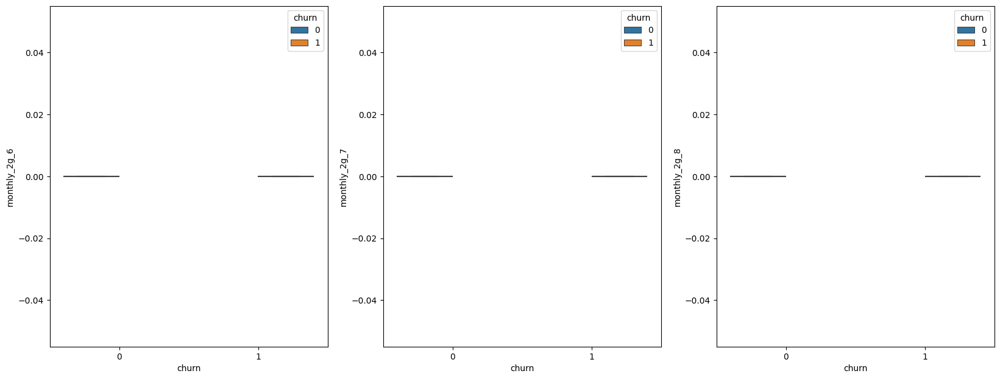

In [49]:
box_plot('monthly_2g')

In [50]:
remove_cols1.append('monthly_2g_6')
remove_cols1.append('monthly_2g_7')
remove_cols1.append('monthly_2g_8')

In [51]:
remove_cols1

['monthly_2g_6', 'monthly_2g_7', 'monthly_2g_8']

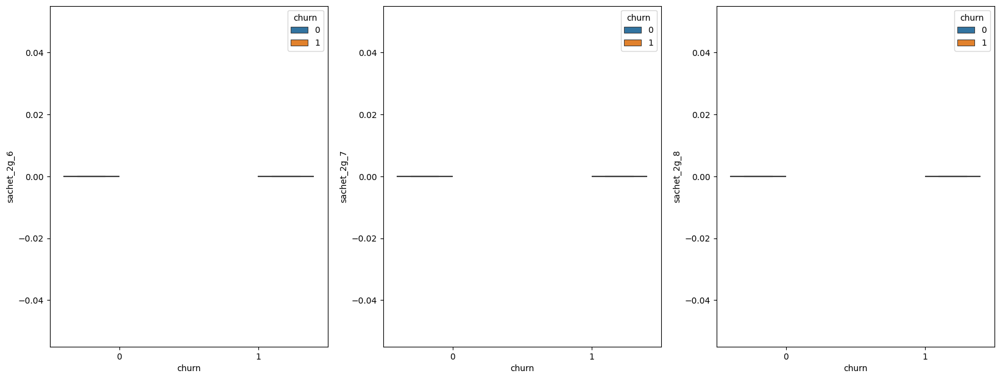

In [52]:
box_plot('sachet_2g')

In [53]:
remove_cols1.append('sachet_2g_6')
remove_cols1.append('sachet_2g_7')
remove_cols1.append('sachet_2g_8')

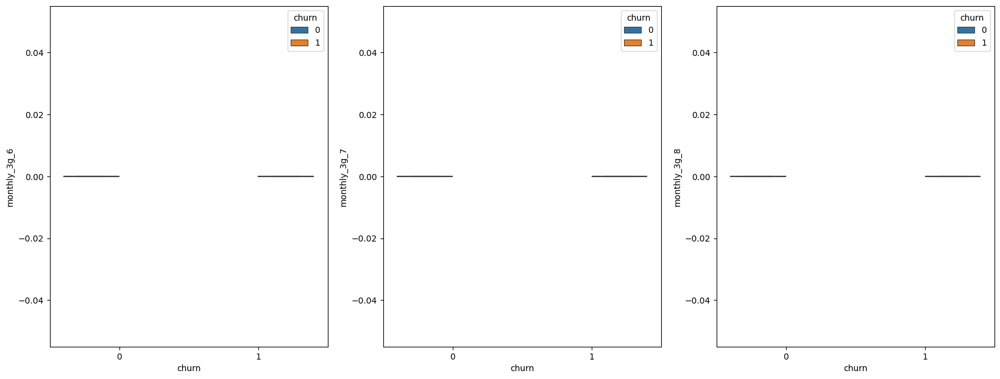

In [54]:
box_plot('monthly_3g')

In [55]:
remove_cols1.append('monthly_3g_6')
remove_cols1.append('monthly_3g_7')
remove_cols1.append('monthly_3g_8')

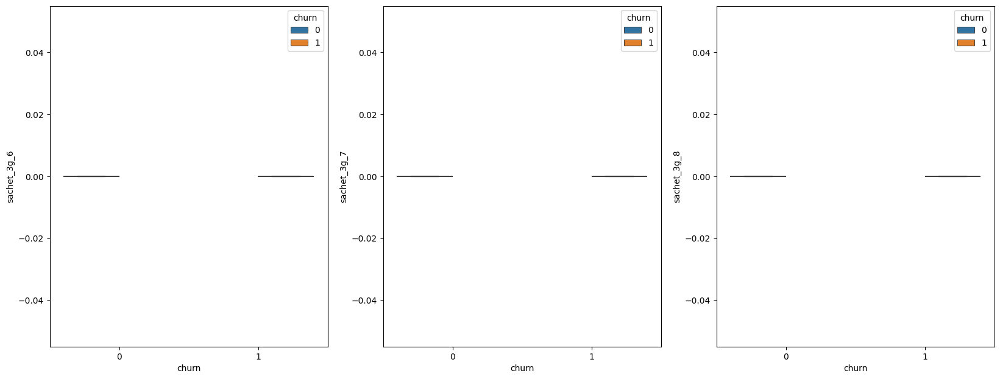

In [56]:
box_plot('sachet_3g')

In [57]:
remove_cols.append('sachet_3g_6')
remove_cols.append('sachet_3g_7')
remove_cols.append('sachet_3g_8')

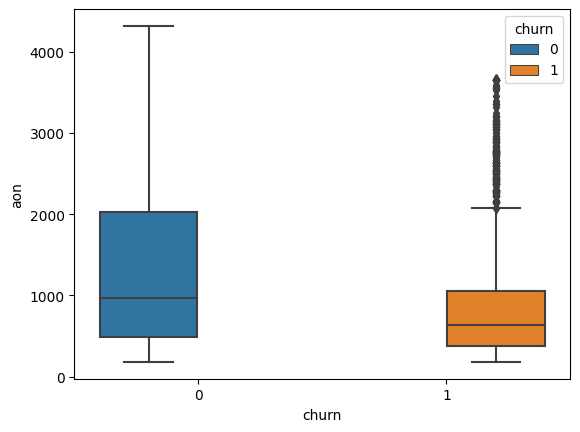

In [58]:
sns.boxplot(data = df_high_value_cust, y = 'aon', x = 'churn', hue = 'churn')
plt.show()

In [59]:
list(df_high_value_cust.select_dtypes('float').columns)

['loc_og_t2o_mou',
 'std_og_t2o_mou',
 'loc_ic_t2o_mou',
 'arpu_6',
 'arpu_7',
 'arpu_8',
 'onnet_mou_6',
 'onnet_mou_7',
 'onnet_mou_8',
 'offnet_mou_6',
 'offnet_mou_7',
 'offnet_mou_8',
 'roam_ic_mou_6',
 'roam_ic_mou_7',
 'roam_ic_mou_8',
 'roam_og_mou_6',
 'roam_og_mou_7',
 'roam_og_mou_8',
 'loc_og_t2t_mou_6',
 'loc_og_t2t_mou_7',
 'loc_og_t2t_mou_8',
 'loc_og_t2m_mou_6',
 'loc_og_t2m_mou_7',
 'loc_og_t2m_mou_8',
 'loc_og_t2f_mou_6',
 'loc_og_t2f_mou_7',
 'loc_og_t2f_mou_8',
 'loc_og_t2c_mou_6',
 'loc_og_t2c_mou_7',
 'loc_og_t2c_mou_8',
 'loc_og_mou_6',
 'loc_og_mou_7',
 'loc_og_mou_8',
 'std_og_t2t_mou_6',
 'std_og_t2t_mou_7',
 'std_og_t2t_mou_8',
 'std_og_t2m_mou_6',
 'std_og_t2m_mou_7',
 'std_og_t2m_mou_8',
 'std_og_t2f_mou_6',
 'std_og_t2f_mou_7',
 'std_og_t2f_mou_8',
 'std_og_t2c_mou_6',
 'std_og_t2c_mou_7',
 'std_og_t2c_mou_8',
 'std_og_mou_6',
 'std_og_mou_7',
 'std_og_mou_8',
 'isd_og_mou_6',
 'isd_og_mou_7',
 'isd_og_mou_8',
 'spl_og_mou_6',
 'spl_og_mou_7',
 'spl_og_mou

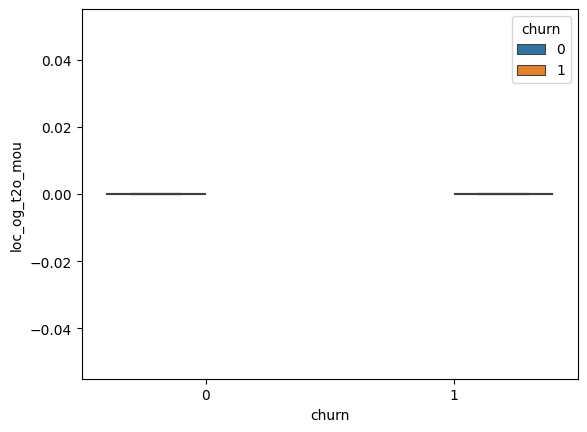

In [60]:
sns.boxplot(data = df_high_value_cust, y = 'loc_og_t2o_mou', x = 'churn', hue = 'churn')
plt.show()

In [61]:
remove_cols1.append('loc_og_t2o_mou')

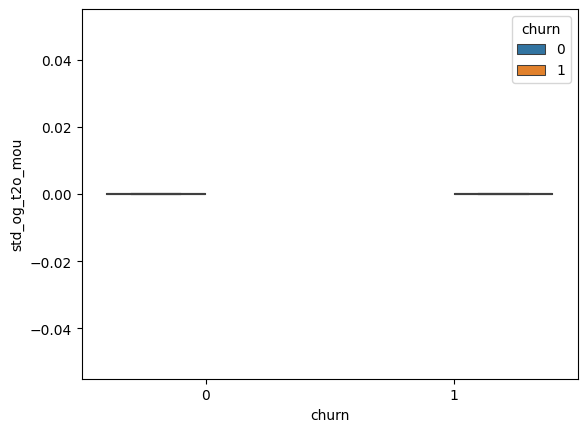

In [62]:
sns.boxplot(data = df_high_value_cust, y = 'std_og_t2o_mou', x = 'churn', hue = 'churn')
plt.show()

In [63]:
remove_cols1.append('std_og_t2o_mou')

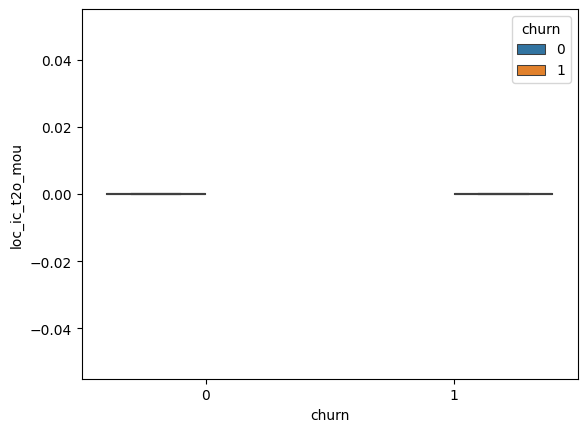

In [64]:
sns.boxplot(data = df_high_value_cust, y = 'loc_ic_t2o_mou', x = 'churn', hue = 'churn')
plt.show()

In [65]:
remove_cols1.append('loc_ic_t2o_mou')

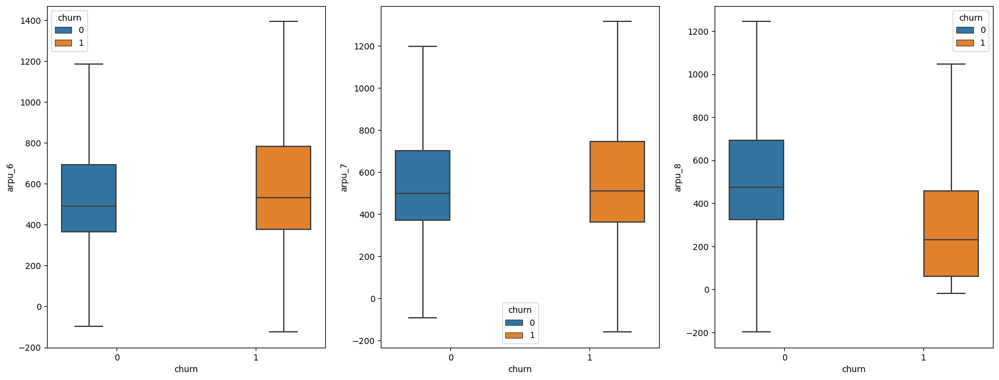

In [66]:
box_plot('arpu')

> We can observe a decrease in average revenue per user in 8th month.

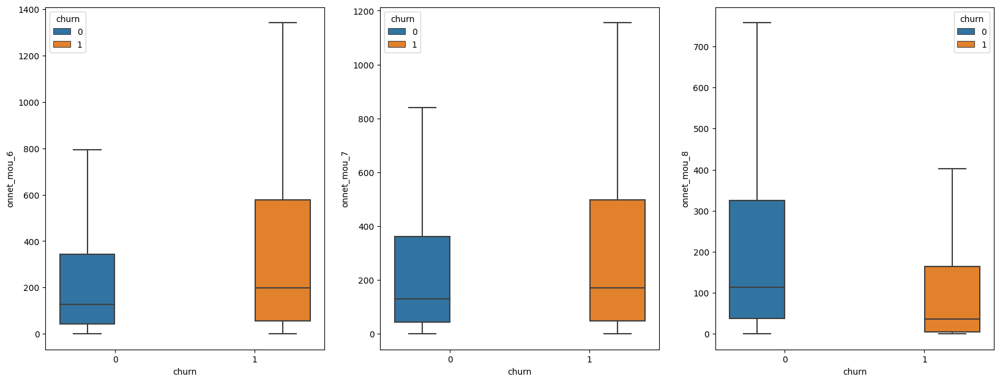

In [67]:
box_plot('onnet_mou')

> We can observe a decrease in on net minutes of usage - voice calls in 8th month.

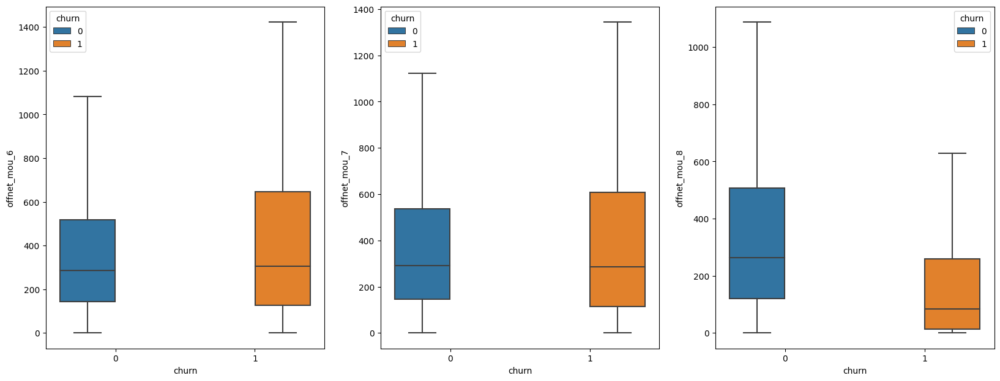

In [68]:
box_plot('offnet_mou')

> We can observe a decrease in off net minutes of usage - voice calls in 8th month.

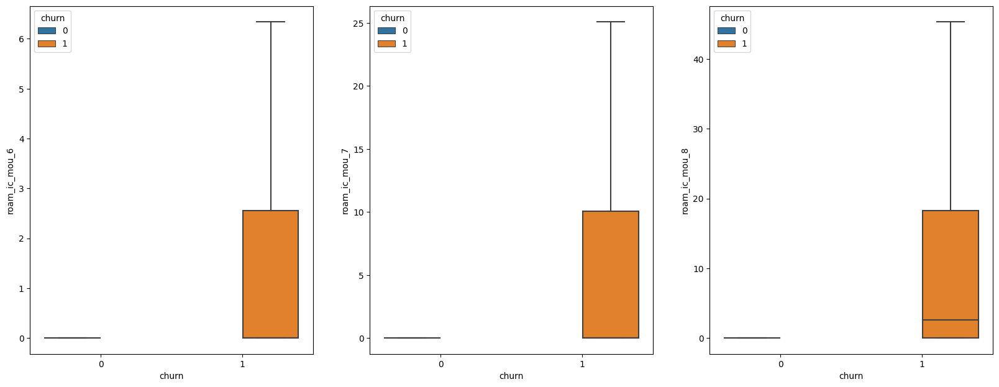

In [69]:
box_plot('roam_ic_mou')

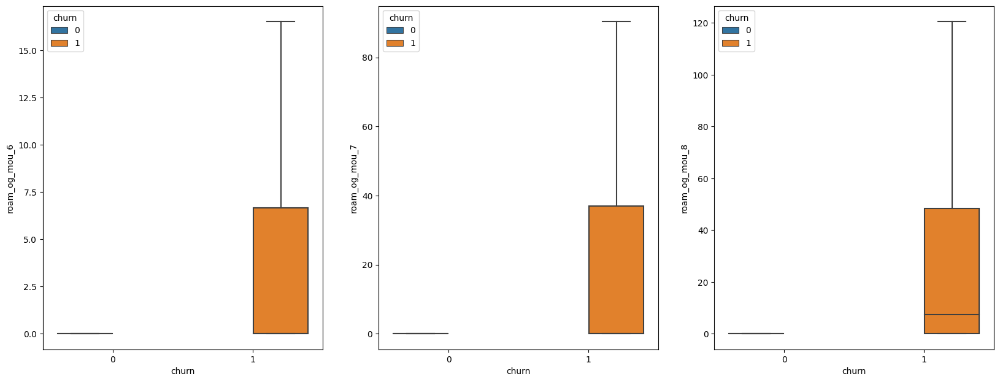

In [70]:
box_plot('roam_og_mou')

> We can observe that the user who are not roaming during outgoing or incoming are not churned

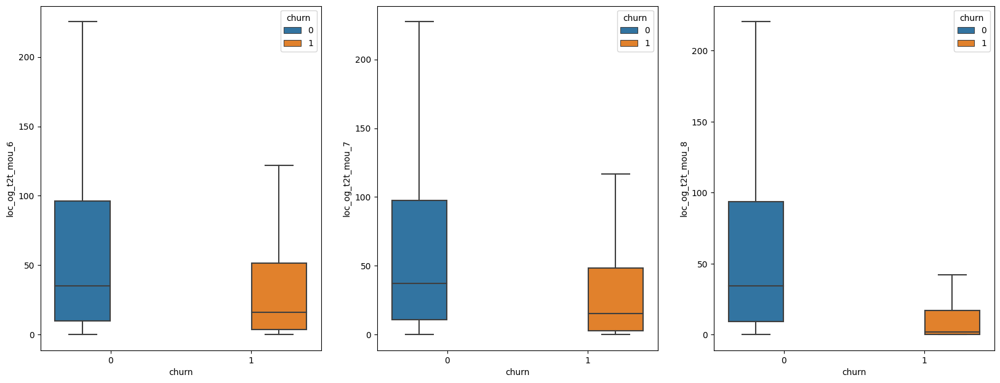

In [71]:
box_plot('loc_og_t2t_mou')

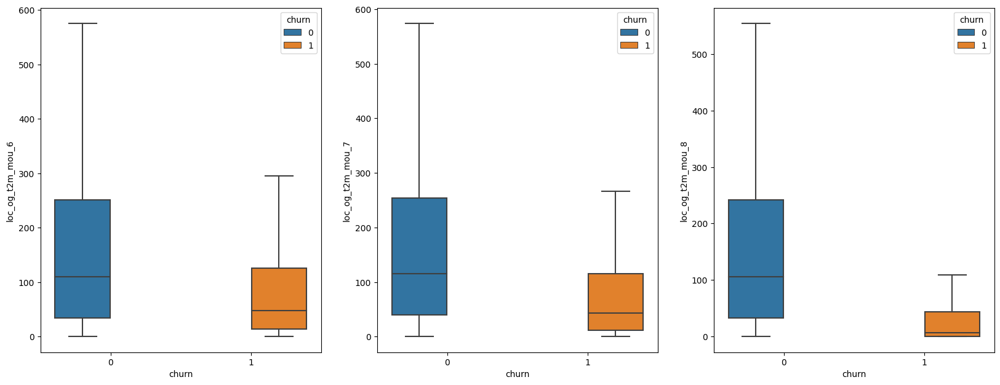

In [72]:
box_plot('loc_og_t2m_mou')

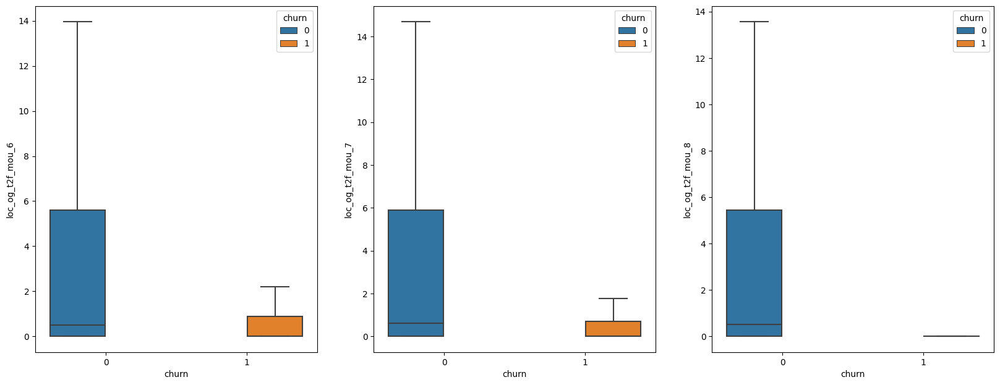

In [73]:
box_plot('loc_og_t2f_mou')

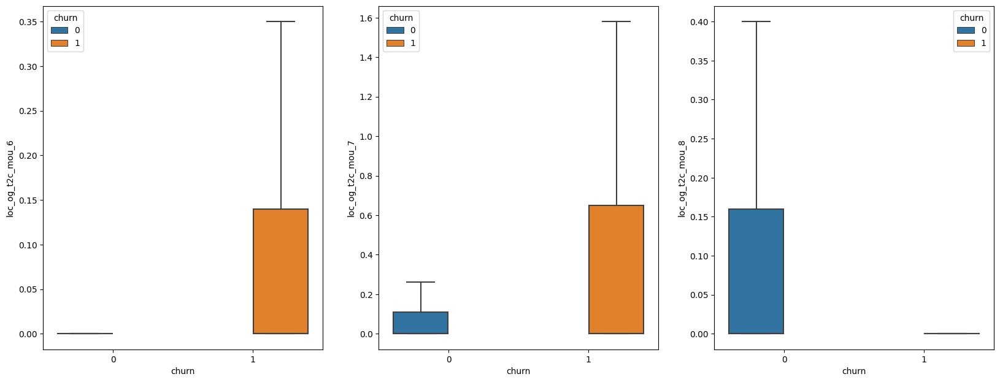

In [74]:
box_plot('loc_og_t2c_mou')

> Based on above results T2T and T2M in 8th month was descresed. There are no T2F who are churned.

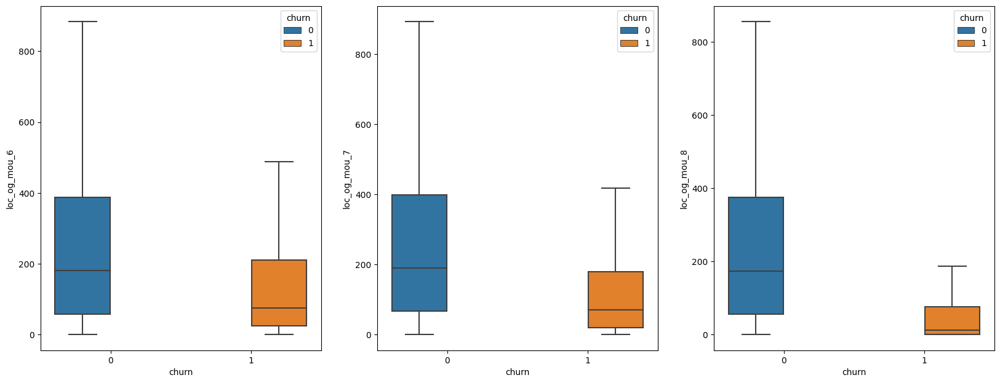

In [75]:
box_plot('loc_og_mou')

> There is decrese in churn who are using local calls in 8th month

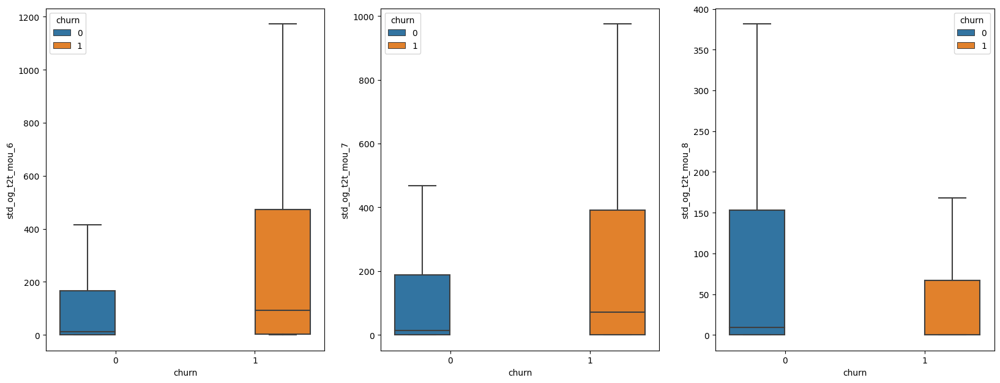

In [76]:
box_plot('std_og_t2t_mou')

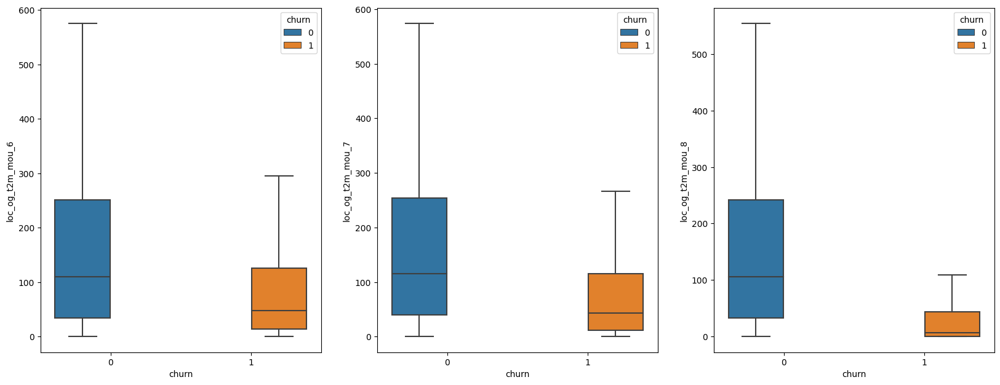

In [77]:
box_plot('loc_og_t2m_mou')

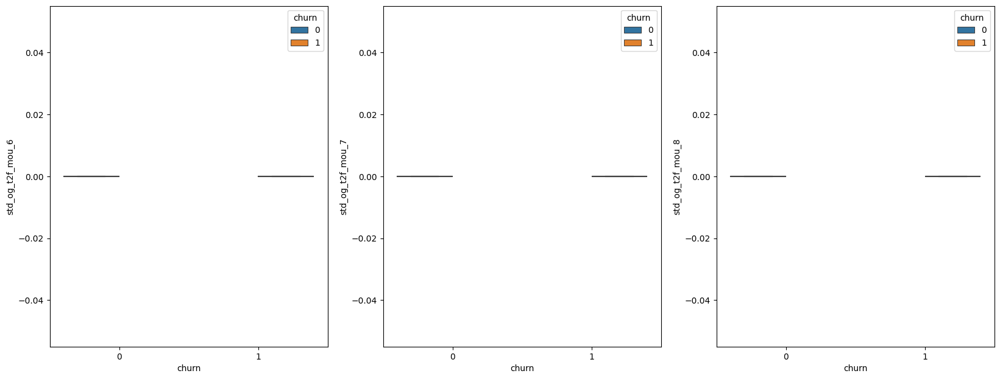

In [78]:
box_plot('std_og_t2f_mou')

In [79]:
remove_cols1.append('std_og_t2f_mou_6')
remove_cols1.append('std_og_t2f_mou_7')
remove_cols1.append('std_og_t2f_mou_8')

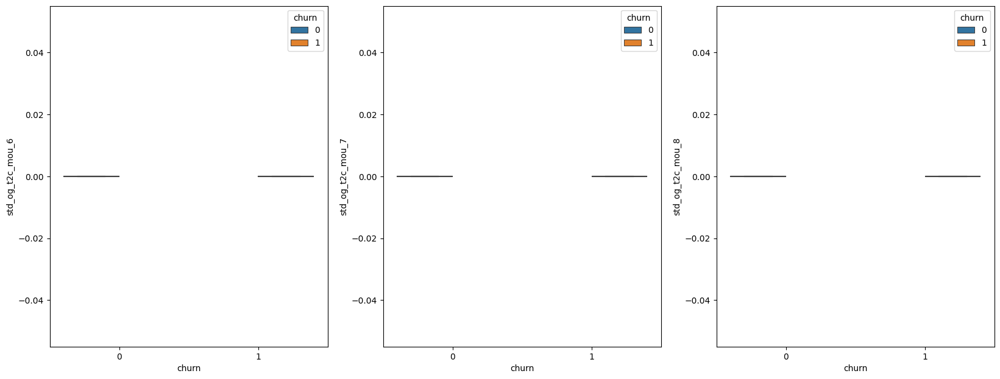

In [80]:
box_plot('std_og_t2c_mou')

In [81]:
remove_cols1.append('std_og_t2c_mou_6')
remove_cols1.append('std_og_t2c_mou_7')
remove_cols1.append('std_og_t2c_mou_8')

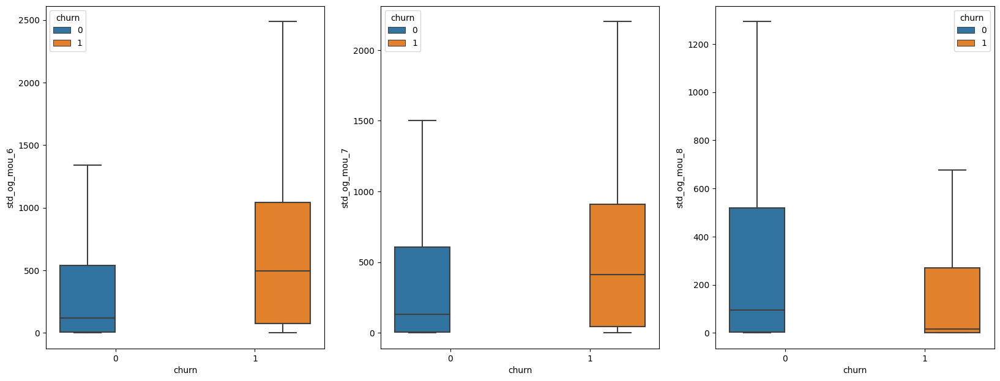

In [82]:
box_plot('std_og_mou')

> We can observe there is a increase in std out going in 8th month

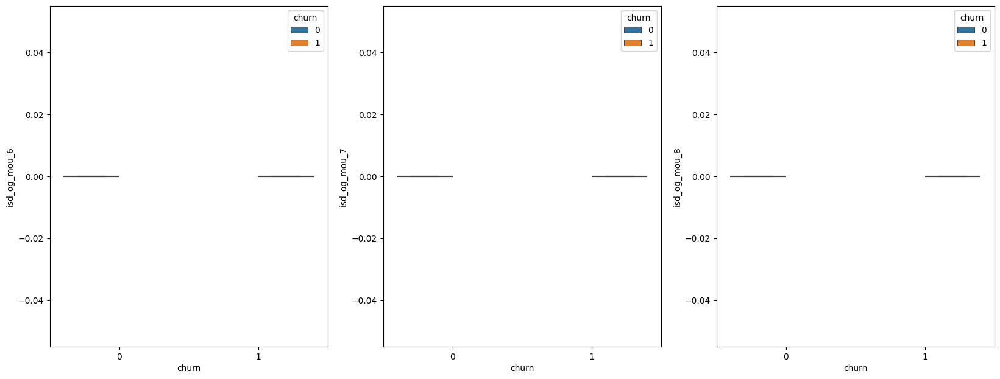

In [83]:
box_plot('isd_og_mou')

In [84]:
remove_cols1.append('isd_og_mou_6')
remove_cols1.append('isd_og_mou_7')
remove_cols1.append('isd_og_mou_8')

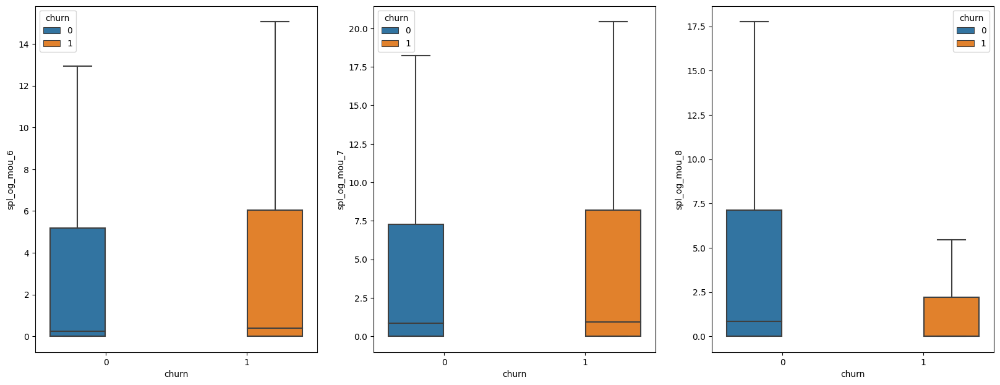

In [85]:
box_plot('spl_og_mou')

> There is a increse in special outgoing calls in 8th month

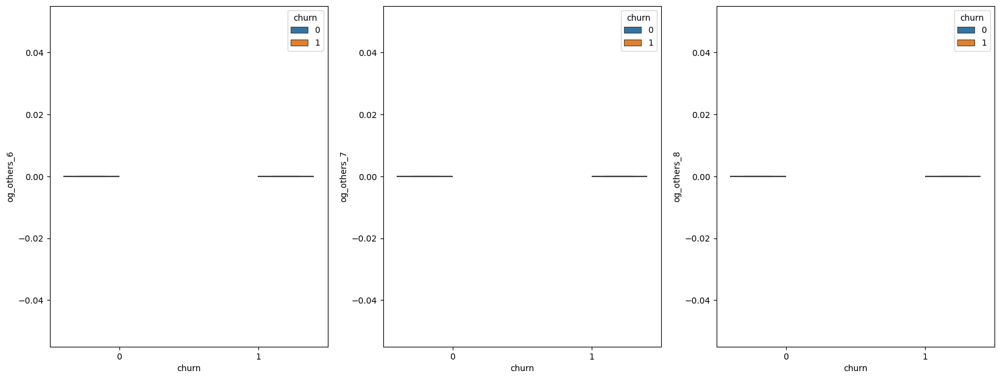

In [86]:
box_plot('og_others')

In [87]:
remove_cols1.append('og_others_6')
remove_cols1.append('og_others_7')
remove_cols1.append('og_others_8')

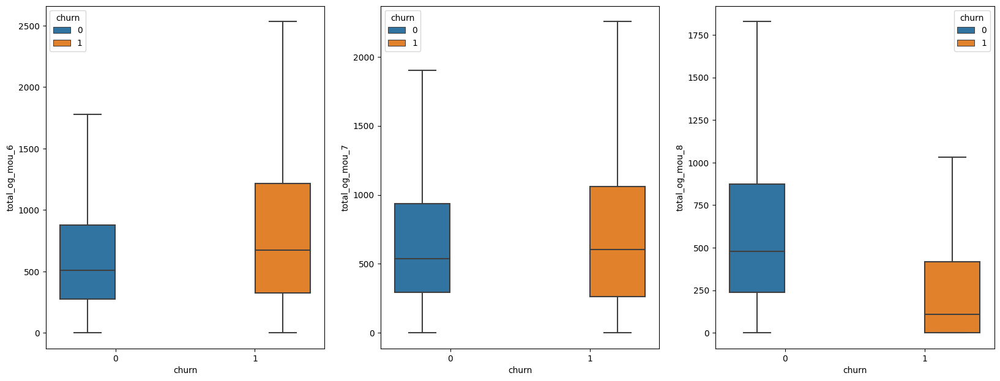

In [88]:
box_plot('total_og_mou')

> We can observe a increase in total outgoing minutes in 8th month.

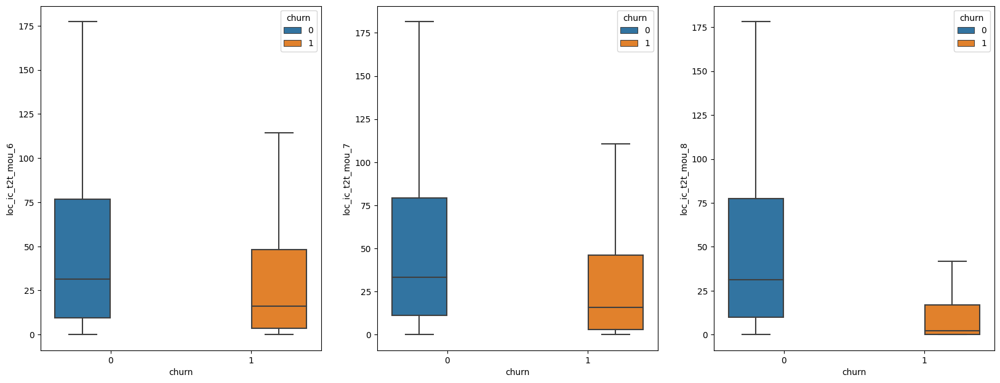

In [89]:
box_plot('loc_ic_t2t_mou')

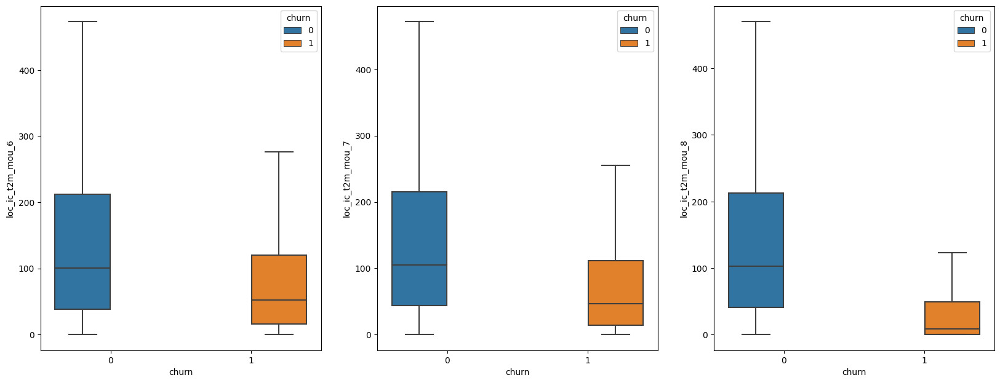

In [90]:
box_plot('loc_ic_t2m_mou')

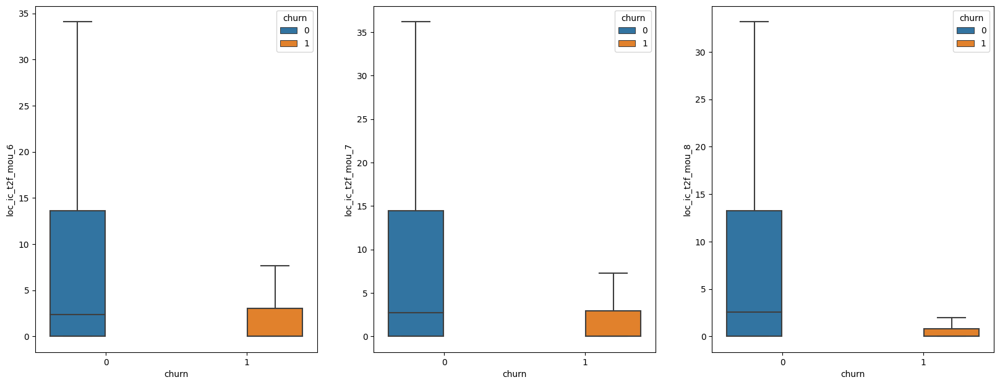

In [91]:
box_plot('loc_ic_t2f_mou')

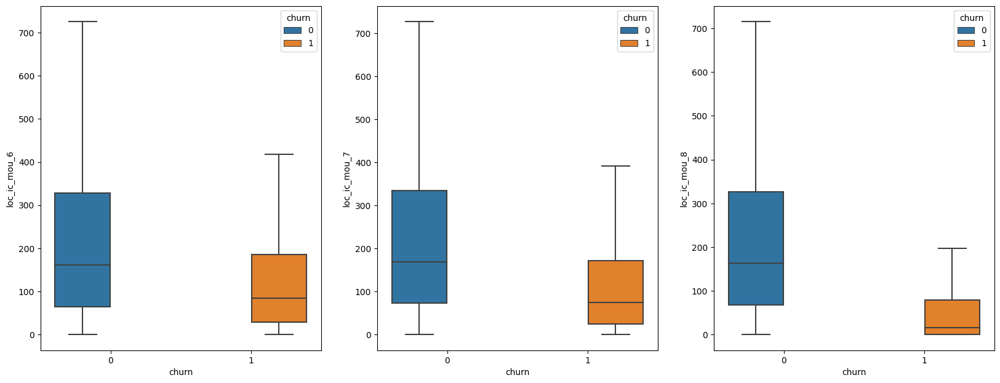

In [92]:
box_plot('loc_ic_mou')

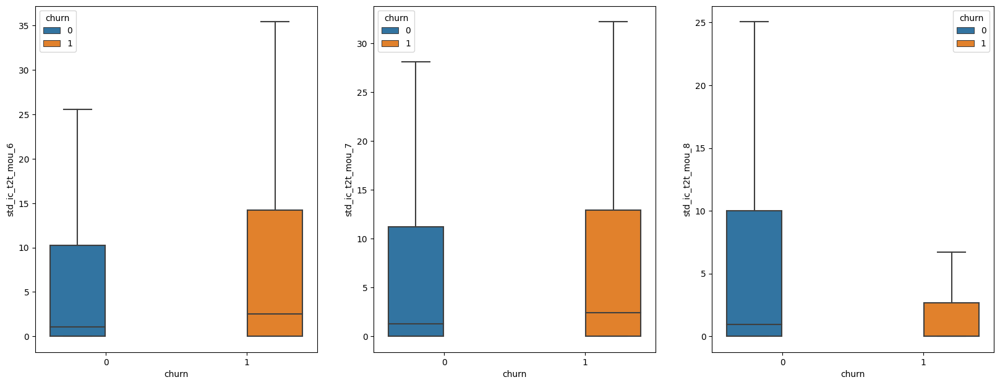

In [93]:
box_plot('std_ic_t2t_mou')

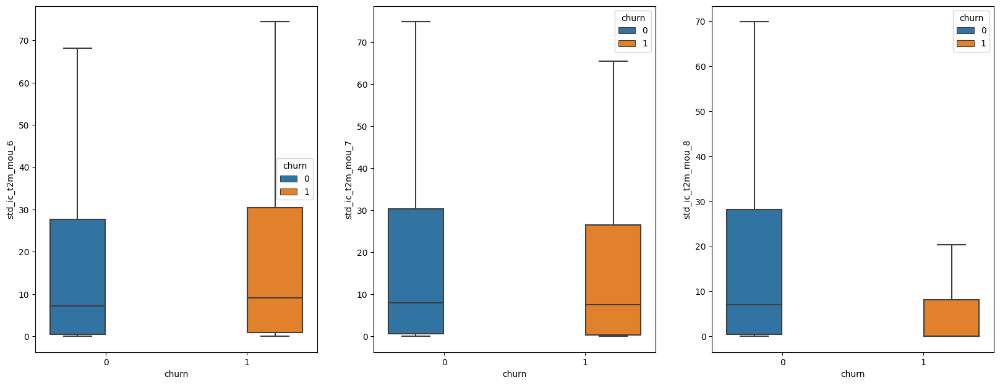

In [94]:
box_plot('std_ic_t2m_mou')

> There is low churn who are using local calls than std calls

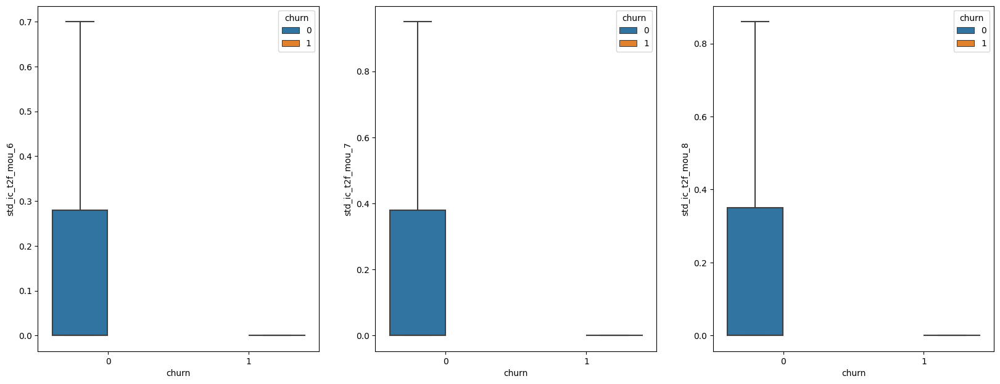

In [95]:
box_plot('std_ic_t2f_mou')

> There is no churn who are using std incoming calls t2f

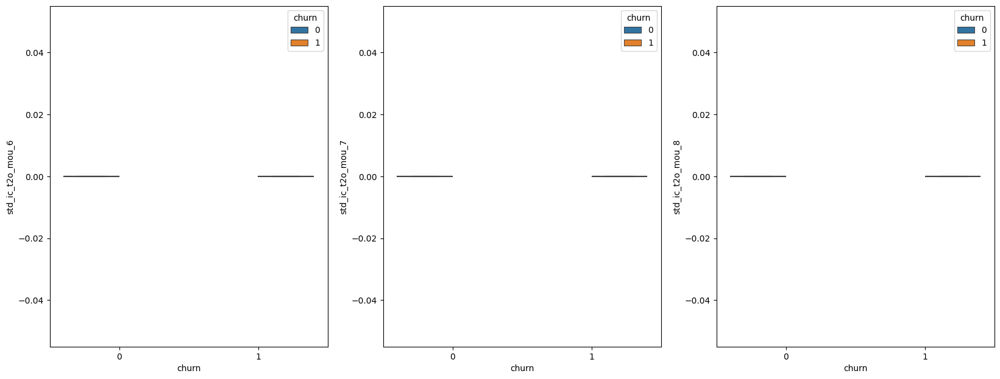

In [96]:
box_plot('std_ic_t2o_mou')

In [97]:
remove_cols1.append('std_ic_t2o_mou_6')
remove_cols1.append('std_ic_t2o_mou_7')
remove_cols1.append('std_ic_t2o_mou_8')

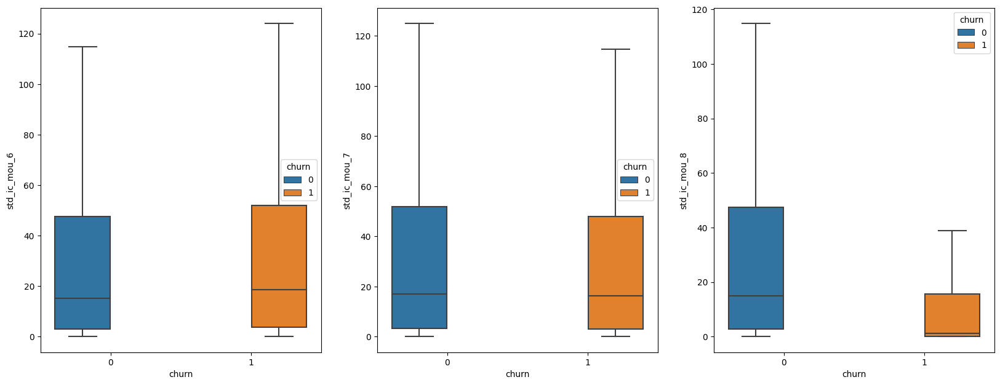

In [98]:
box_plot('std_ic_mou')

> There is low churn who are using local calls than std calls

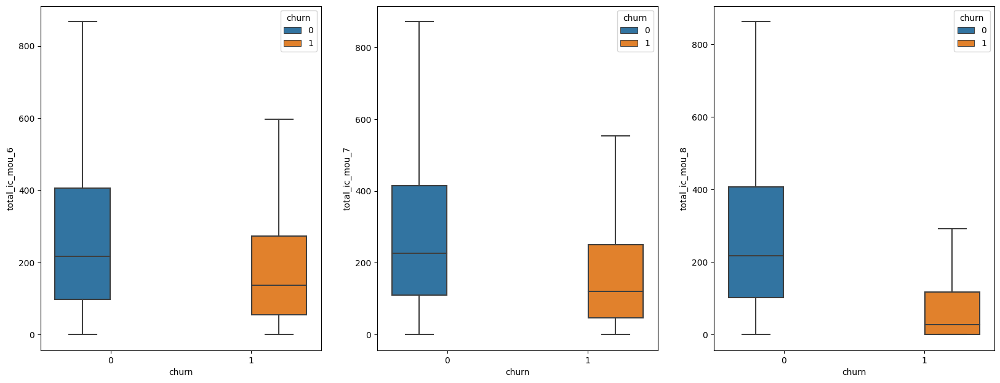

In [99]:
box_plot('total_ic_mou')

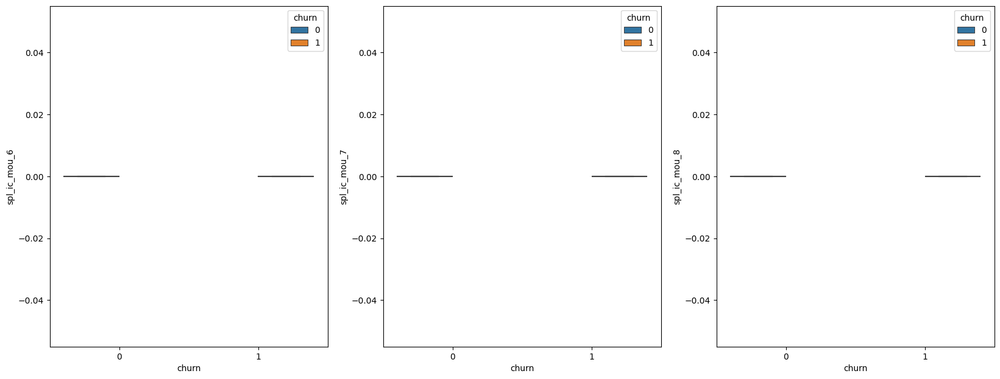

In [100]:
box_plot('spl_ic_mou')

In [101]:
remove_cols1.append('spl_ic_mou_6')
remove_cols1.append('spl_ic_mou_7')
remove_cols1.append('spl_ic_mou_8')

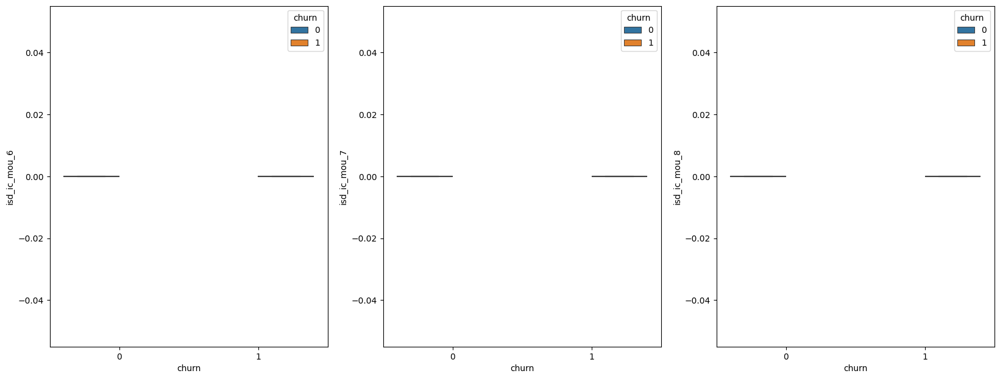

In [102]:
box_plot('isd_ic_mou')

In [103]:
remove_cols1.append('isd_ic_mou_6')
remove_cols1.append('isd_ic_mou_7')
remove_cols1.append('isd_ic_mou_8')

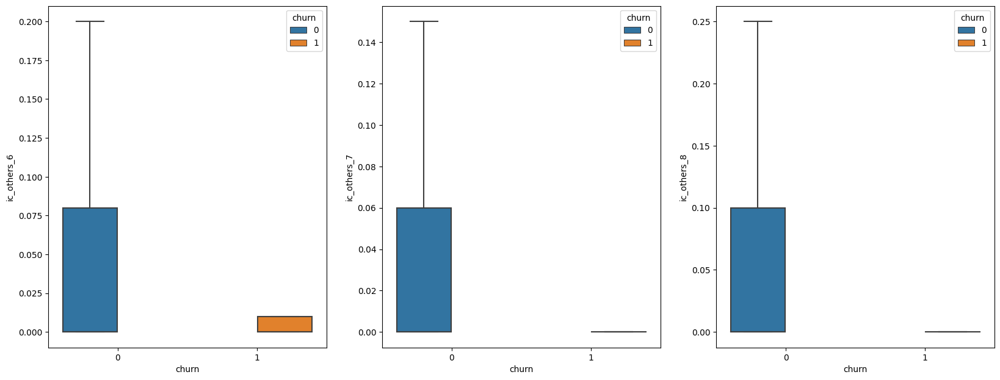

In [104]:
box_plot('ic_others')

> There are no churns in 7th and 8th month who are using other incoming calls

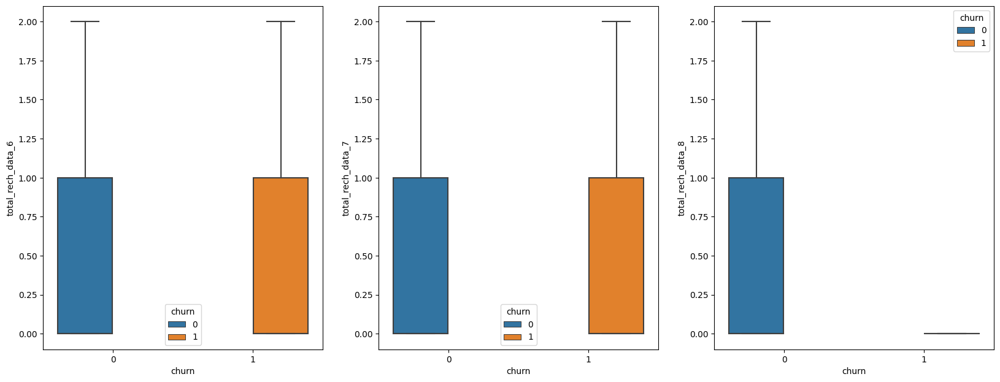

In [105]:
box_plot('total_rech_data')

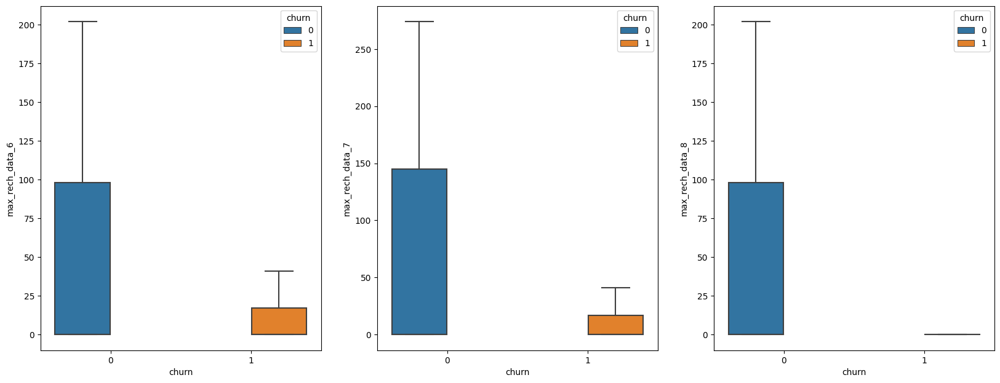

In [106]:
box_plot('max_rech_data')

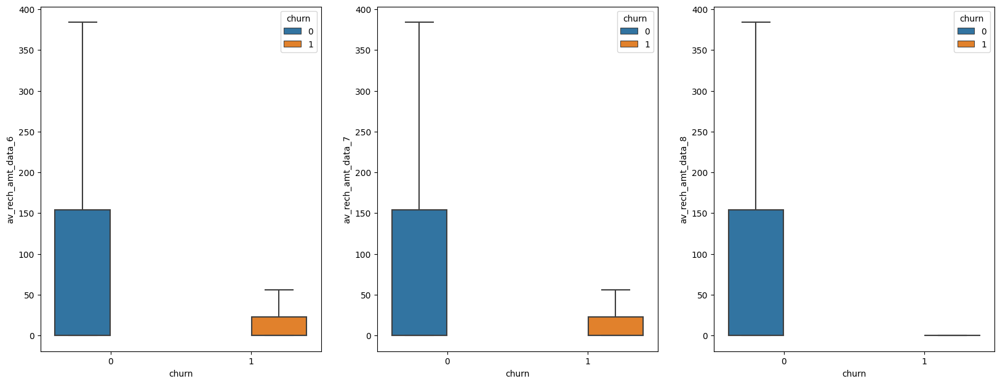

In [107]:
box_plot('av_rech_amt_data')

> The one who haven't recharged data in 8th month are all churned

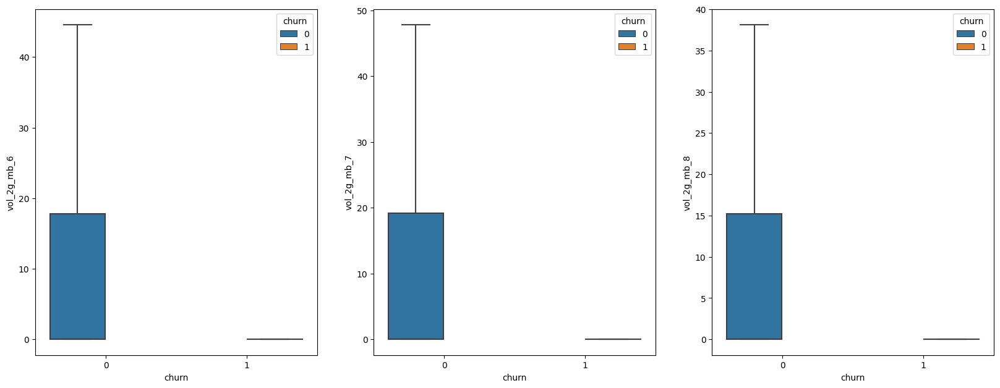

In [108]:
box_plot('vol_2g_mb')

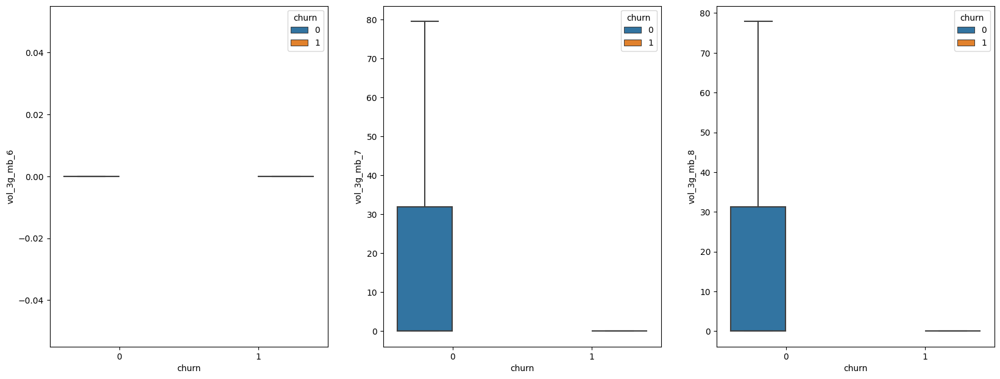

In [109]:
box_plot('vol_3g_mb')

> The one who have recharged vol 2g or 3g in 7th month and 8th month are not churned

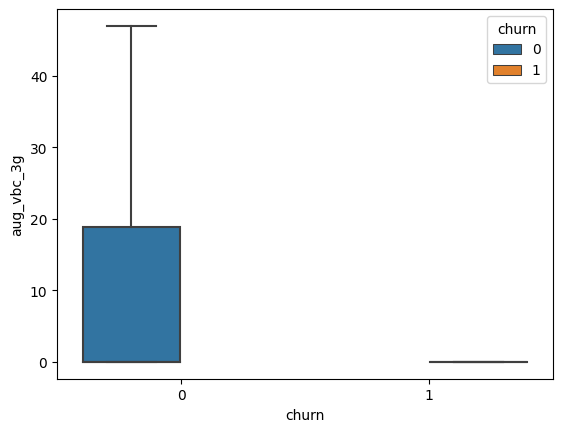

In [110]:
sns.boxplot(data = df_high_value_cust, y = 'aug_vbc_3g', x = 'churn', hue = 'churn', showfliers = False)
plt.show()

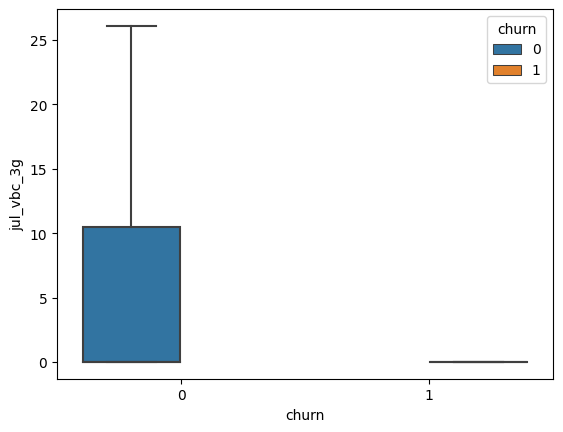

In [111]:
sns.boxplot(data = df_high_value_cust, y = 'jul_vbc_3g', x = 'churn', hue = 'churn', showfliers = False)
plt.show()

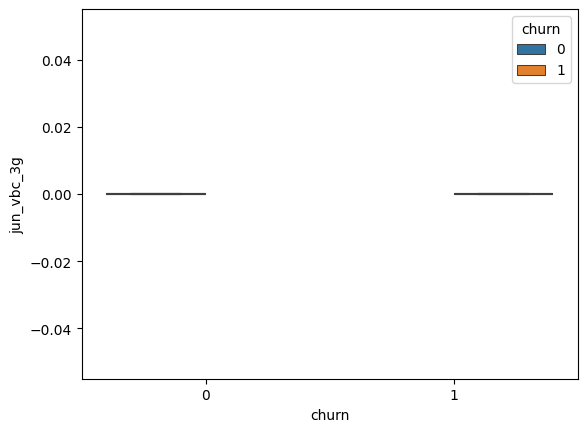

In [112]:
sns.boxplot(data = df_high_value_cust, y = 'jun_vbc_3g', x = 'churn', hue = 'churn', showfliers = False)
plt.show()

In [113]:
remove_cols1.append('jun_vbc_3g')
remove_cols1.append('sep_vbc_3g')

In [114]:
df_high_value_cust.drop(remove_cols1, axis = 1, inplace = True)

In [115]:
df_high_value_cust.shape

(28455, 118)

### 3. Derive New Features

In [116]:
cols = list(df_high_value_cust.columns)

In [117]:
cols_6_7 = []
for i in cols:
    if ('_6' in i) or ('_7' in i):
        cols_6_7.append(i)
        
cols_6_7

['last_date_of_month_6',
 'last_date_of_month_7',
 'arpu_6',
 'arpu_7',
 'onnet_mou_6',
 'onnet_mou_7',
 'offnet_mou_6',
 'offnet_mou_7',
 'roam_ic_mou_6',
 'roam_ic_mou_7',
 'roam_og_mou_6',
 'roam_og_mou_7',
 'loc_og_t2t_mou_6',
 'loc_og_t2t_mou_7',
 'loc_og_t2m_mou_6',
 'loc_og_t2m_mou_7',
 'loc_og_t2f_mou_6',
 'loc_og_t2f_mou_7',
 'loc_og_t2c_mou_6',
 'loc_og_t2c_mou_7',
 'loc_og_mou_6',
 'loc_og_mou_7',
 'std_og_t2t_mou_6',
 'std_og_t2t_mou_7',
 'std_og_t2m_mou_6',
 'std_og_t2m_mou_7',
 'std_og_mou_6',
 'std_og_mou_7',
 'spl_og_mou_6',
 'spl_og_mou_7',
 'total_og_mou_6',
 'total_og_mou_7',
 'loc_ic_t2t_mou_6',
 'loc_ic_t2t_mou_7',
 'loc_ic_t2m_mou_6',
 'loc_ic_t2m_mou_7',
 'loc_ic_t2f_mou_6',
 'loc_ic_t2f_mou_7',
 'loc_ic_mou_6',
 'loc_ic_mou_7',
 'std_ic_t2t_mou_6',
 'std_ic_t2t_mou_7',
 'std_ic_t2m_mou_6',
 'std_ic_t2m_mou_7',
 'std_ic_t2f_mou_6',
 'std_ic_t2f_mou_7',
 'std_ic_mou_6',
 'std_ic_mou_7',
 'total_ic_mou_6',
 'total_ic_mou_7',
 'ic_others_6',
 'ic_others_7',
 'total_

In [118]:
avg_cols = []
for i in cols_6_7:
    if ('_6' in i):
        avg_cols.append(i.replace('_6',''))
    else:
        avg_cols.append(i.replace('_7',''))

    
set_avg_cols = set(avg_cols)
avg_cols_list = list(set_avg_cols)
avg_cols_list.remove('last_date_of_month')
avg_cols_list.remove('date_of_last_rech')

In [119]:
for i in avg_cols_list:
    df_high_value_cust[i + '_GP'] = (df_high_value_cust[i + '_6'] + df_high_value_cust[i + '_7'])/2

In [120]:
df_high_value_cust.drop(cols_6_7, axis = 1, inplace = True)

In [121]:
df_high_value_cust.drop(['circle_id','last_date_of_month_8','date_of_last_rech_8'], axis = 1, inplace = True)

In [122]:
df_high_value_cust.shape

(28455, 76)

### 4. PCA

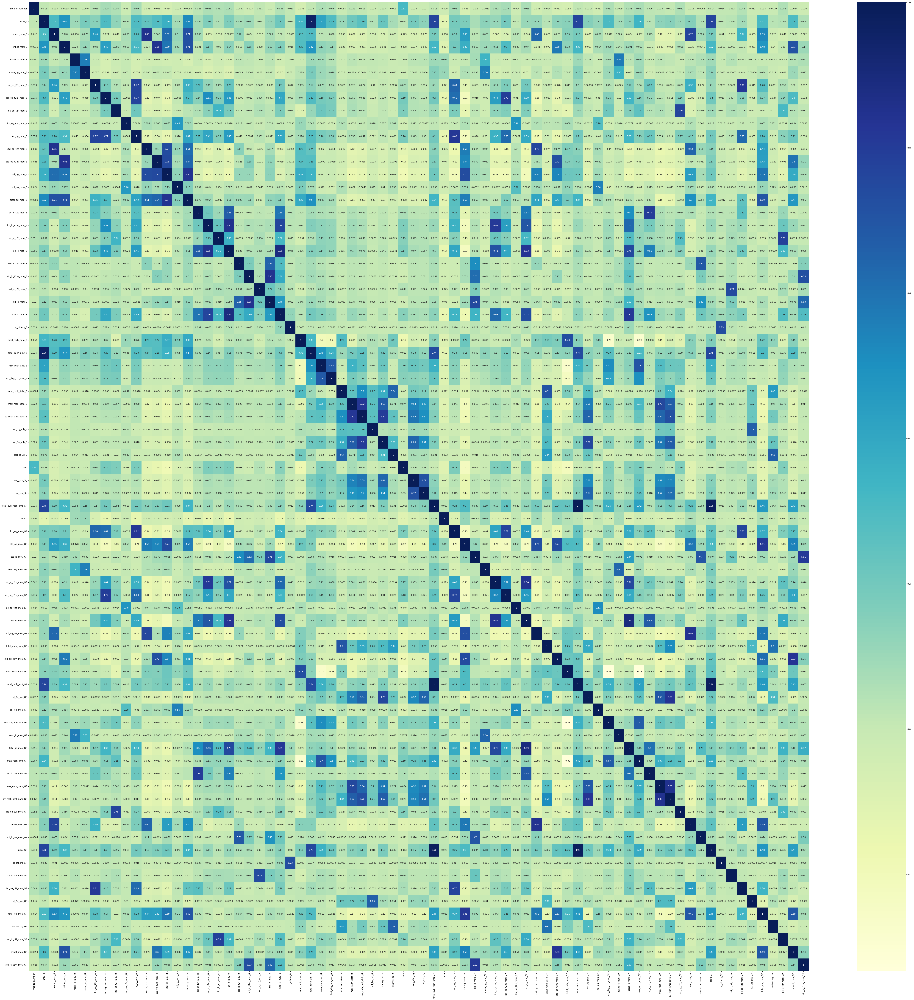

In [123]:
# heat map
plt.figure(figsize = (80,80))
sns.heatmap(df_high_value_cust.corr(), annot = True, cmap = 'YlGnBu')
plt.show()

#### Test, Train split

In [124]:
X = df_high_value_cust.drop(['churn','mobile_number'], axis = 1)
y = df_high_value_cust['churn']

In [125]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

In [126]:
(y_train.sum()/len(y_train))*100

6.175318807109147

> We have 6% churn rate in training set

#### Feature Scaling

In [127]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19918 entries, 93662 to 19693
Data columns (total 74 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   arpu_8                 19918 non-null  float64
 1   onnet_mou_8            19918 non-null  float64
 2   offnet_mou_8           19918 non-null  float64
 3   roam_ic_mou_8          19918 non-null  float64
 4   roam_og_mou_8          19918 non-null  float64
 5   loc_og_t2t_mou_8       19918 non-null  float64
 6   loc_og_t2m_mou_8       19918 non-null  float64
 7   loc_og_t2f_mou_8       19918 non-null  float64
 8   loc_og_t2c_mou_8       19918 non-null  float64
 9   loc_og_mou_8           19918 non-null  float64
 10  std_og_t2t_mou_8       19918 non-null  float64
 11  std_og_t2m_mou_8       19918 non-null  float64
 12  std_og_mou_8           19918 non-null  float64
 13  spl_og_mou_8           19918 non-null  float64
 14  total_og_mou_8         19918 non-null  float64
 15

In [128]:
num_vars = list(X_train.select_dtypes('float').columns) + list(X_train.select_dtypes('int').columns)

In [129]:
scaler = StandardScaler()

X_train[num_vars] = scaler.fit_transform(X_train[num_vars])

X_train

,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_t2f_mou_8,loc_og_t2c_mou_8,loc_og_mou_8,std_og_t2t_mou_8,std_og_t2m_mou_8,std_og_mou_8,spl_og_mou_8,total_og_mou_8,loc_ic_t2t_mou_8,loc_ic_t2m_mou_8,loc_ic_t2f_mou_8,loc_ic_mou_8,std_ic_t2t_mou_8,std_ic_t2m_mou_8,std_ic_t2f_mou_8,std_ic_mou_8,total_ic_mou_8,ic_others_8,total_rech_num_8,total_rech_amt_8,max_rech_amt_8,last_day_rch_amt_8,total_rech_data_8,max_rech_data_8,av_rech_amt_data_8,vol_2g_mb_8,vol_3g_mb_8,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,total_avg_rech_amt_GP,loc_og_mou_GP,std_og_mou_GP,std_ic_mou_GP,roam_og_mou_GP,loc_ic_t2m_mou_GP,loc_og_t2m_mou_GP,loc_og_t2c_mou_GP,loc_ic_mou_GP,std_og_t2t_mou_GP,total_rech_data_GP,std_og_t2m_mou_GP,total_rech_num_GP,total_rech_amt_GP,vol_3g_mb_GP,spl_og_mou_GP,last_day_rch_amt_GP,roam_ic_mou_GP,total_ic_mou_GP,max_rech_amt_GP,loc_ic_t2t_mou_GP,max_rech_data_GP,av_rech_amt_data_GP,loc_og_t2f_mou_GP,onnet_mou_GP,std_ic_t2t_mou_GP,arpu_GP,ic_others_GP,std_ic_t2f_mou_GP,loc_og_t2t_mou_GP,vol_2g_mb_GP,total_og_mou_GP,sachet_3g_GP,loc_ic_t2f_mou_GP,offnet_mou_GP,std_ic_t2m_mou_GP
93662,0.301097,-0.558100,0.604121,-0.180826,-0.204878,-0.322096,-0.205859,-0.293217,-0.239472,-0.360493,-0.426053,0.840432,0.291602,-0.163699,0.056685,-0.368902,-0.152607,-0.280480,-0.333681,-0.206881,-0.149945,0.010354,-0.215968,-0.406311,-0.109934,0.444993,-0.072848,1.386686,-0.684844,1.978852,0.971607,0.961047,-0.265019,-0.156430,-0.148442,-0.538266,-0.332495,-0.330353,-0.313266,-0.553111,-0.151803,-0.366963,-0.265166,-0.528463,-0.468321,-0.274988,-0.606475,-0.500858,1.139374,0.273500,-0.480542,-0.313266,-0.346592,-0.358671,-0.973676,-0.228512,-0.706934,2.260029,-0.373512,-0.362752,-0.077953,-0.195297,-0.665807,-0.209727,-0.752231,-0.120309,-0.154231,-0.370652,-0.319740,-0.489959,-0.171591,-0.296963,-0.063886,-0.329295
59996,-0.590156,-0.455843,-0.563161,-0.180826,-0.204878,-0.177216,-0.262646,-0.001385,-0.179490,-0.283407,-0.395723,-0.436356,-0.563686,-0.240512,-0.678739,-0.314156,-0.460816,-0.311570,-0.529396,-0.029345,-0.222482,-0.130653,-0.200332,-0.564299,-0.071341,-0.695350,-0.714612,-0.217750,0.219644,-0.439480,-0.553200,-0.498384,-0.265388,-0.318569,-0.148442,1.512198,-0.332495,-0.330353,-0.736520,-0.359928,-0.646233,-0.306144,-0.265166,-0.541276,-0.455886,-0.274988,-0.566215,-0.456406,-0.469595,-0.486130,-0.932468,-0.736520,-0.346592,-0.289895,0.066061,-0.228512,-0.646688,-0.409571,-0.262353,-0.607714,-0.542488,-0.054957,-0.480983,-0.205339,-0.868172,-0.102250,-0.154231,-0.103018,-0.319981,-0.839857,-0.171591,-0.351740,-0.739335,-0.243703
24105,-0.106836,-0.573923,1.667461,-0.180826,-0.204878,-0.343005,-0.568386,-0.316415,-0.239472,-0.604554,-0.431627,2.281800,1.245644,-0.292921,0.781895,-0.394773,-0.553533,-0.352173,-0.641593,-0.207538,-0.080441,-0.130653,-0.184629,-0.653990,-0.109934,-0.280680,-0.002803,-0.217750,0.219644,-0.439480,-0.553200,-0.498384,-0.265388,-0.318569,-0.148442,-0.401978,-0.332495,-0.330353,-0.349412,-0.666272,0.747832,-0.259581,-0.225981,-0.635702,-0.642929,-0.274988,-0.692651,-0.469641,-0.469595,1.546330,-0.706505,-0.349412,-0.346592,-0.011071,0.066061,-0.219326,-0.737445,-0.341032,-0.378079,-0.607714,-0.542488,-0.312068,-0.634340,-0.161646,-0.430236,-0.120309,-0.154231,-0.363318,-0.319981,0.305336,-0.171591,-0.357455,1.016957,-0.212487
56944,-0.277525,0.128515,0.173365,-0.180826,-0.204878,-0.355069,-0.706425,-0.316415,-0.239472,-0.699697,0.381148,0.668173,0.704240,0.062739,0.251830,-0.396242,-0.695651,-0.352173,-0.743306,-0.199785,-0.279405,-0.130653,-0.329634,-0.799235,-0.109934,0.133990,-0.250801,-0.217750,-0.336964,0.366631,-0.305667,-0.227114,-0.086695,-0.201985,0.869697,-0.494203,-0.329384,-0.171293,-0.209493,-0.720751,0.940763,-0.355179,-0.265166,-0.662987,-0.703222,0.137002,-0.735147,1.108628,-0.239743,0.286695,-0.028617,-0.209493,0.028043,-0.095250,-0.595590,-0.228512,-0.811437,-0.258785,-0.423462,0.212377,-0.098150,-0.312068,0.740093,-0.193473,-0.164380,-0.067984,

In [130]:
X_train.describe()

,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_t2f_mou_8,loc_og_t2c_mou_8,loc_og_mou_8,std_og_t2t_mou_8,std_og_t2m_mou_8,std_og_mou_8,spl_og_mou_8,total_og_mou_8,loc_ic_t2t_mou_8,loc_ic_t2m_mou_8,loc_ic_t2f_mou_8,loc_ic_mou_8,std_ic_t2t_mou_8,std_ic_t2m_mou_8,std_ic_t2f_mou_8,std_ic_mou_8,total_ic_mou_8,ic_others_8,total_rech_num_8,total_rech_amt_8,max_rech_amt_8,last_day_rch_amt_8,total_rech_data_8,max_rech_data_8,av_rech_amt_data_8,vol_2g_mb_8,vol_3g_mb_8,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,total_avg_rech_amt_GP,loc_og_mou_GP,std_og_mou_GP,std_ic_mou_GP,roam_og_mou_GP,loc_ic_t2m_mou_GP,loc_og_t2m_mou_GP,loc_og_t2c_mou_GP,loc_ic_mou_GP,std_og_t2t_mou_GP,total_rech_data_GP,std_og_t2m_mou_GP,total_rech_num_GP,total_rech_amt_GP,vol_3g_mb_GP,spl_og_mou_GP,last_day_rch_amt_GP,roam_ic_mou_GP,total_ic_mou_GP,max_rech_amt_GP,loc_ic_t2t_mou_GP,max_rech_data_GP,av_rech_amt_data_GP,loc_og_t2f_mou_GP,onnet_mou_GP,std_ic_t2t_mou_GP,arpu_GP,ic_others_GP,std_ic_t2f_mou_GP,loc_og_t2t_mou_GP,vol_2g_mb_GP,total_og_mou_GP,sachet_3g_GP,loc_ic_t2f_mou_GP,offnet_mou_GP,std_ic_t2m_mou_GP
count,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04,1.991800e+04
mean,-4.530522e-17,2.051220e-17,1.908527e-17,-7.134680e-19,1.426936e-17,9.453450e-18,3.745707e-17,-4.031094e-17,-1.355589e-17,-3.264116e-17,4.013257e-17,1.712323e-17,2.104730e-17,-3.032239e-17,5.351010e-17,-9.703164e-17,-2.143971e-16,7.491414e-18,2.782525e-17,-8.561615e-18,-1.070202e-17,-9.275083e-18,-1.747996e-17,2.154673e-16,2.069057e-17,2.158241e-17,8.204881e-17,-1.783670e-17,-1.855017e-17,4.102441e-18,-3.638687e-17,-4.601868e-17,-1.426936e-18,-2.033384e-17,-1.587466e-17,-9.560471e-17,6.492558e-17,-3.531666e-17,-9.881531e-17,-8.383248e-17,-6.349865e-17,8.062188e-17,-3.424646e-17,1.969172e-16,-5.707744e-18,4.994276e-18,-2.211751e-17,5.351010e-18,5.029949e-17,-2.140404e-17,8.632962e-17,-9.881531e-17,-7.277373e-17,-1.355589e-17,-4.173788e-17,-3.210606e-17,1.548225e-16,2.140404e-18,-5.386683e-17,6.563905e-17,2.711178e-17,-4.637542e-18,2.497138e-17,-2.425791e-17,-1.460826e-16,4.459175e-18,1.248569e-17,1.997710e-17,-5.993131e-17,-1.526821e-16,-2.497138e-18,-4.280808e-18,-6.528232e-17,-4.280808e-17
std,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.000025e+00,1.00002

In [131]:
pca = PCA(0.95)

In [132]:
X_train_pca = pca.fit_transform(X_train)

In [133]:
X_train_pca.shape

(19918, 37)

In [134]:
pca.get_feature_names_out()

array(['pca0', 'pca1', 'pca2', 'pca3', 'pca4', 'pca5', 'pca6', 'pca7',
       'pca8', 'pca9', 'pca10', 'pca11', 'pca12', 'pca13', 'pca14',
       'pca15', 'pca16', 'pca17', 'pca18', 'pca19', 'pca20', 'pca21',
       'pca22', 'pca23', 'pca24', 'pca25', 'pca26', 'pca27', 'pca28',
       'pca29', 'pca30', 'pca31', 'pca32', 'pca33', 'pca34', 'pca35',
       'pca36'], dtype=object)

In [135]:
X_train_pca = pd.DataFrame(X_train_pca, columns = pca.get_feature_names_out())

In [136]:
X_train_pca

,pca0,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,pca10,pca11,pca12,pca13,pca14,pca15,pca16,pca17,pca18,pca19,pca20,pca21,pca22,pca23,pca24,pca25,pca26,pca27,pca28,pca29,pca30,pca31,pca32,pca33,pca34,pca35,pca36
0,-1.051867,-0.452994,1.526458,-0.208559,0.296641,-1.359948,-0.344397,0.450998,0.230421,-0.772431,1.151645,-0.593468,-0.814973,0.386924,0.076349,-0.745598,0.074674,0.316470,0.293319,0.667318,-0.413933,-0.101999,0.583225,-0.482834,0.205365,-0.548215,-0.393840,-0.757629,-0.303515,0.407223,-1.965753,-0.275451,0.192982,-0.189748,-1.389371,0.454972,-1.224763
1,-2.925779,-1.334158,-1.036918,-0.287097,1.162942,0.463728,-0.183476,0.532372,0.343790,-0.184753,0.154223,-0.367559,-0.664889,-0.037541,0.103741,-0.212276,0.064261,0.173636,-0.118176,-0.652281,0.148720,-1.073153,-0.127905,0.256527,-0.194844,0.202716,0.145912,0.308737,0.088271,0.078969,0.078773,0.023395,0.014731,0.041334,0.284953,-0.173777,0.303346
2,-1.851323,2.495328,0.230097,0.180974,1.429729,-2.424792,-1.188965,0.940636,-0.805204,0.211909,1.437397,0.193355,-0.650112,-0.148792,0.236195,-0.366861,-0.180790,0.679050,0.210977,0.391095,0.191034,0.093349,-0.001900,0.200663,-0.025552,0.424529,0.196109,0.105379,-0.165986,-0.018069,-0.095262,0.124092,0.440142,0.008317,0.176933,-0.134228,0.263128
3,-2.246343,1.976818,1.244017,-0.433655,-0.442652,0.105565,-0.738843,-0.222699,-0.252184,-0.321856,0.040783,0.288006,-0.261844,-0.075005,0.151210,-0.135927,-0.371626,0.050622,-0.065282,0.100156,-0.193059,0.068606,0.285025,-0.025757,0.099628,0.071960,0.147693,-0.012969,-0.154714,0.211324,0.000796,-0.049746,0.622653,0.881155,-0.543016,0.042509,-0.149779
4,-2.355298,0.931121,0.020289,0.037081,1.999405,-0.997596,2.550664,-0.220421,-1.313223,0.513122,0.241367,1.431317,0.371689,-0.612375,0.093680,0.405531,-0.950792,0.568924,0.088860,1.110266,-2.634562,0.223832,-1.101120,0.566216,0.985861,0.801864,-0.733824,0.571069,0.075680,1.906280,-0.064577,-0.019400,-1.348936,0.130090,0.278796,-0.101764,0.112166
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19913,-1.757095,-3.296006,2.492672,-0.056759,-0.198597,0.201627,-0.678528,0.564736,-0.297688,-0.069436,0.516756,-0.433264,0.124957,0.033502,-0.141849,-0.046385,-0.292341,0.158298,-0.025380,-0.101042,-0.540708,-0.662009,-0.087827,-0.096404,-1.126294,0.125512,0.019506,-0.104394,0.120102,-0.070905,-0.218916,0.246560,0.026959,0.561913,-0.231082,0.264822,-0.349545
19914,-1.554037,2.201969,-0.282694,-0.018962,-0.251972,2.783662,-0.763999,-0.457740,-0.331108,-0.552086,-0.464361,-0.322395,-0.297295,0.043140,-0.059755,-0.244806,-0.461889,0.299340,-0.096678,-0.055329,-0.283535,0.086998,-0.023658,-0.173837,-0.149875,0.069074,0.384161,0.140850,0.049612,0.102196,0.040530,-0.041987,0.227564,0.156836,0.123831,-0.113952,0.173335
19915,7.086646,-2.351547,-0.610287,-2.275687,0.028966,-1.706433,-0.613983,2.448324,0.176442,-0.729852,0.426046,-3.862362,0.823583,-1.103308,0.252982,0.437582,-0.969376,0.456491,-1.395275,-2.064315,-0.039762,0.275352,-0.456841,0.590445,0.648930,-0.929888,1.129438,0.287262,0.834812,1.010131,0.113828,-2.752105,0.221885,0.199097,-1.057573,0.213418,-0.229241
19916,-3.126847,-1.031724,-1.435305,-0.192216,-0.460391,-0.333201,0.314630,-0.264276,0.649014,1.113124,-0.749222,0.467644,-0.016879,0.173476,0.587463,0.699009,0.537954,-0.020252,0.245852,-0.198641,-0.187791,0.097352,-0.213186,0.233109,0.180785,0.309798,1.096196,-0.662447,-0.103668,-0.268449,0.223444,0.575848,0.034590,-0.097586,-0.069400,0.315910,0.453399


In [137]:
corrmat = np.corrcoef(X_train_pca.transpose())

In [138]:
corrmat.shape

(37, 37)

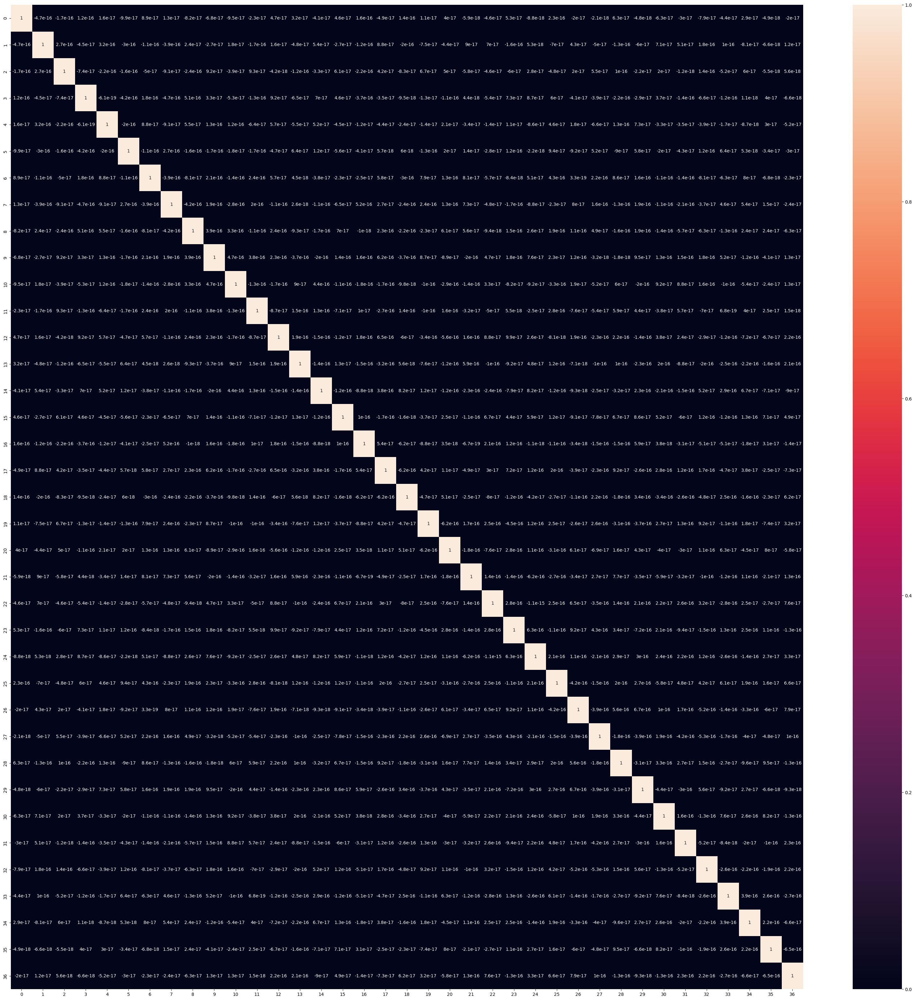

In [139]:
plt.figure(figsize=[40,40])
sns.heatmap(corrmat, annot=True)
plt.show()

### 5. Building the model (Logistic Regression)

In [140]:
# Logistic regression model
lr = LogisticRegression()
model = lr.fit(X_train_pca,y_train)

### 6. Evaluating the model on test data

In [142]:
X_test[num_vars] = scaler.transform(X_test[num_vars])

In [144]:
X_test.describe()

,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_t2f_mou_8,loc_og_t2c_mou_8,loc_og_mou_8,std_og_t2t_mou_8,std_og_t2m_mou_8,std_og_mou_8,spl_og_mou_8,total_og_mou_8,loc_ic_t2t_mou_8,loc_ic_t2m_mou_8,loc_ic_t2f_mou_8,loc_ic_mou_8,std_ic_t2t_mou_8,std_ic_t2m_mou_8,std_ic_t2f_mou_8,std_ic_mou_8,total_ic_mou_8,ic_others_8,total_rech_num_8,total_rech_amt_8,max_rech_amt_8,last_day_rch_amt_8,total_rech_data_8,max_rech_data_8,av_rech_amt_data_8,vol_2g_mb_8,vol_3g_mb_8,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,total_avg_rech_amt_GP,loc_og_mou_GP,std_og_mou_GP,std_ic_mou_GP,roam_og_mou_GP,loc_ic_t2m_mou_GP,loc_og_t2m_mou_GP,loc_og_t2c_mou_GP,loc_ic_mou_GP,std_og_t2t_mou_GP,total_rech_data_GP,std_og_t2m_mou_GP,total_rech_num_GP,total_rech_amt_GP,vol_3g_mb_GP,spl_og_mou_GP,last_day_rch_amt_GP,roam_ic_mou_GP,total_ic_mou_GP,max_rech_amt_GP,loc_ic_t2t_mou_GP,max_rech_data_GP,av_rech_amt_data_GP,loc_og_t2f_mou_GP,onnet_mou_GP,std_ic_t2t_mou_GP,arpu_GP,ic_others_GP,std_ic_t2f_mou_GP,loc_og_t2t_mou_GP,vol_2g_mb_GP,total_og_mou_GP,sachet_3g_GP,loc_ic_t2f_mou_GP,offnet_mou_GP,std_ic_t2m_mou_GP
count,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000,8537.000000
mean,-0.007438,-0.023456,0.002124,0.004482,0.001207,-0.011668,0.002875,-0.020191,-0.007289,-0.007085,-0.020088,0.000175,-0.013523,-0.020588,-0.015378,0.003869,-0.001720,0.008985,0.001981,-0.006910,-0.001319,-0.006003,-0.005367,0.001337,0.020196,-0.029337,-0.005579,0.011420,-0.010593,-0.017634,-0.007857,-0.016770,0.000532,-0.024429,0.002305,0.003407,-0.014687,-0.008213,-0.012688,-0.002798,-0.016641,0.003916,-0.014702,0.010445,0.011827,0.011145,0.002236,-0.017557,-0.014709,-0.007336,-0.034016,-0.012688,-0.019572,0.001943,-0.007983,-0.005513,0.005746,0.011671,-0.007050,-0.012463,-0.020690,-0.018582,-0.025010,-0.006500,-0.015664,0.017772,0.003616,-0.013807,0.013243,-0.015628,-0.004256,-0.008770,0.000258,0.010558
std,1.322113,0.967124,1.031044,1.023202,0.993849,0.875159,0.979377,0.832030,1.024484,0.946790,0.995606,1.026050,1.013620,0.763697,1.004366,1.051629,0.997244,1.107522,1.009372,0.892877,0.864991,0.867030,0.865321,0.978228,1.533956,0.936428,1.391407,0.993822,0.947233,0.959511,0.991058,0.953751,1.019932,0.852065,1.038268,1.004302,0.907860,0.949566,1.433890,0.951368,0.993659,0.921153,0.880035,1.028195,0.997662,1.255347,1.007802,1.008418,0.961676,0.982803,0.954976,1.433890,0.910210,0.960591,1.032367,0.940483,0.993229,1.019014,1.012970,0.972519,0.964787,0.755463,0.974919,0.859246,1.468635,1.729350,0.975423,0.889262,1.125301,0.996025,0.967045,0.918066,1.008033,1.019633
min,-2.033656,-0.592249,-0.824527,-0.180826,-0.204878,-0.368861,-0.734143,-0.316415,-0.239472,-0.726344,-0.437128,-0.446251,-0.598245,-0.292921,-0.956407,-0.438467,-0.727934,-0.352173,-0.787598,-0.207538,-0.283241,-0.130653,-0.336516,-0.839510,-0.109934,-1.006352,-1.206820,-0.990257,-0.684844,-0.439480,-0.553200,-0.498384,-0.265388,-0.318569,-0.148442,-1.125430,-0.332495,-0.330353,-0.773832,-0.793121,-0.710445,-0.378891,-0.265166,-0.784601,-0.795133,-0.274988,-0.838959,-0.509965,-0.469595,-0.526896,-1.271412,-0.773832,-0.346592,-0.358671,-0.973676,-0.228512,-0.912073,-1.0

In [145]:
X_test_pca = pca.transform(X_test)
X_test_pca.shape

(8537, 37)

In [151]:
pred_probs_test = model.predict_proba(X_test_pca)

In [221]:
"{:2.4}".format(metrics.roc_auc_score(y_test, pred_probs_test[:,1]))

'0.8626'

### Random Forest

In [157]:
from sklearn.ensemble import RandomForestClassifier

In [158]:
rf = RandomForestClassifier(n_estimators=10, max_depth=4, max_features=5, random_state=100, oob_score=True)

In [159]:
%%time
rf.fit(X_train, y_train)

CPU times: total: 266 ms
Wall time: 393 ms


RandomForestClassifier(max_depth=4, max_features=5, n_estimators=10,
                       oob_score=True, random_state=100)

In [160]:
rf.oob_score_

0.9437694547645346

In [164]:
from sklearn.metrics import plot_roc_curve

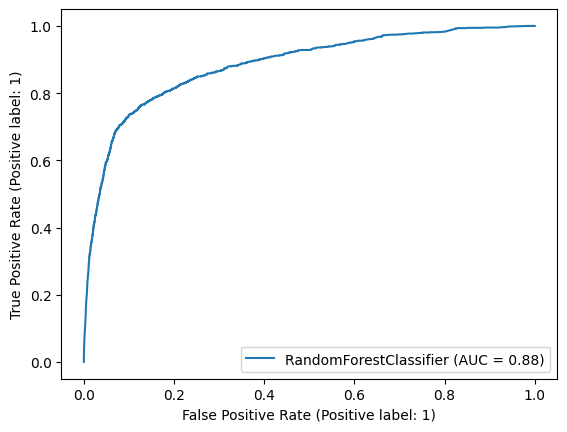

In [165]:
plot_roc_curve(rf, X_train, y_train)
plt.show()

##### Hyper-parameter tuning for the Random Forest

In [166]:
rf = RandomForestClassifier(random_state=42, n_jobs=-1)

In [168]:
params = {
    'max_depth': [2,3,5,10,20],
    'min_samples_leaf': [5,10,20,50,100,200],
    'n_estimators': [10, 25, 50, 100]
}

In [169]:
grid_search = GridSearchCV(estimator=rf,
                           param_grid=params,
                           cv = 4,
                           n_jobs=-1, verbose=1, scoring="accuracy")

In [170]:
%%time
grid_search.fit(X_train, y_train)

Fitting 4 folds for each of 120 candidates, totalling 480 fits
CPU times: total: 17.3 s
Wall time: 3min 44s


GridSearchCV(cv=4, estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [2, 3, 5, 10, 20],
                         'min_samples_leaf': [5, 10, 20, 50, 100, 200],
                         'n_estimators': [10, 25, 50, 100]},
             scoring='accuracy', verbose=1)

In [171]:
grid_search.best_score_

0.9457777988838261

In [172]:
rf_best = grid_search.best_estimator_
rf_best

RandomForestClassifier(max_depth=10, min_samples_leaf=5, n_jobs=-1,
                       random_state=42)

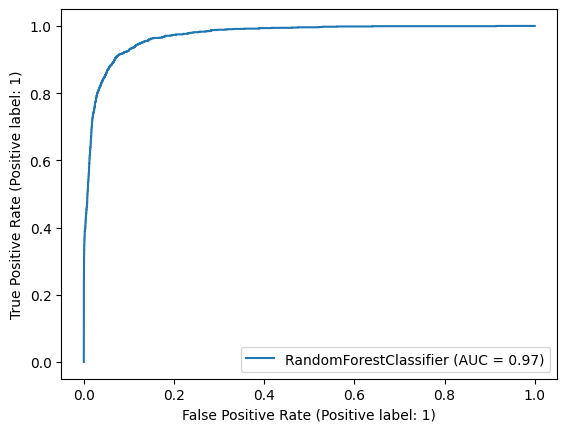

In [173]:
plot_roc_curve(rf_best, X_train, y_train)
plt.show()

In [174]:
imp_df = pd.DataFrame({
    "Varname": X_train.columns,
    "Imp": rf_best.feature_importances_
})

In [175]:
imp_df.sort_values(by="Imp", ascending=False)

,Varname,Imp
23,total_ic_mou_8,0.079208
18,loc_ic_mou_8,0.071019
16,loc_ic_t2m_mou_8,0.049217
14,total_og_mou_8,0.048938
4,roam_og_mou_8,0.041114
3,roam_ic_mou_8,0.038528
0,arpu_8,0.031805
9,loc_og_mou_8,0.031284
6,loc_og_t2m_mou_8,0.028974
15,loc_ic_t2t_mou_8,0.027989


In [176]:
from IPython.display import Image  
from six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz

In [181]:
rf = rf_best

In [182]:
%%time
rf.fit(X_train, y_train)

CPU times: total: 12.8 s
Wall time: 1.96 s


RandomForestClassifier(max_depth=10, min_samples_leaf=5, n_jobs=-1,
                       random_state=42)

In [192]:
sample_tree = rf.estimators_[17]

In [194]:
sample_tree

DecisionTreeClassifier(max_depth=10, max_features='sqrt', min_samples_leaf=5,
                       random_state=613608295)


(process:24308): GLib-GIO-WARNING **: 22:43:55.714: Unexpectedly, UWP app `HaukeGtze.7-ZipFileManagerUnofficial_1.2201.1.0_x64__6bk20wvc8rfx2' (AUMId `HaukeGtze.7-ZipFileManagerUnofficial_6bk20wvc8rfx2!zFM.exe') supports 36 extensions but has no verbs

(process:24308): GLib-GIO-WARNING **: 22:43:56.200: Unexpectedly, UWP app `Clipchamp.Clipchamp_2.7.9.0_neutral__yxz26nhyzhsrt' (AUMId `Clipchamp.Clipchamp_yxz26nhyzhsrt!App') supports 41 extensions but has no verbs

(process:24308): GLib-GIO-WARNING **: 22:43:56.320: Unexpectedly, UWP app `Microsoft.OutlookForWindows_1.2023.816.0_x64__8wekyb3d8bbwe' (AUMId `Microsoft.OutlookForWindows_8wekyb3d8bbwe!Microsoft.OutlookforWindows') supports 1 extensions but has no verbs

(process:24308): GLib-GIO-WARNING **: 22:43:56.420: Unexpectedly, UWP app `Microsoft.ScreenSketch_11.2306.44.0_x64__8wekyb3d8bbwe' (AUMId `Microsoft.ScreenSketch_8wekyb3d8bbwe!App') supports 29 extensions but has no verbs



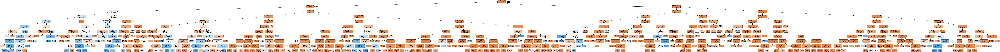

In [195]:
dot_data = StringIO()
export_graphviz(sample_tree, out_file=dot_data, filled=True, rounded=True,
                feature_names=X_train.columns)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

In [215]:
# Confusion matrix 
confusion = metrics.confusion_matrix(y_train, y_train_pred )
print(confusion)

[[18600    88]
 [  698   532]]


In [217]:
# Let's check the overall accuracy.
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

print('Accuracy =',metrics.accuracy_score(y_train, y_train_pred))
Precision = TP/(TP + FP)
print('Precision =',Precision)
Recall = TP/(TP + FN)
print('Recall = ',Recall)
Sensitivity = TP/(TP + FN)
print('Sensitivity =',Sensitivity)
Prevalance = (TP + FN)/(TP + TN + FP + FN)
print('Prevalance =',Prevalance)
Specificity = TN/(TN + FP)
print('Specificity =',Specificity)
Positive_Predictive_Value = TP / float(TP+FP)
print('Positive Predictive Value =', Positive_Predictive_Value)
Negative_Predictive_Value = TN / float(TN+ FN)
print('Negative Predictive Value =', Negative_Predictive_Value)
True_Positive_Rate = TP/(TP + FN)
print('True Positive Rate =',True_Positive_Rate)
False_Positive_Rate = FP/(FP + TN)
print('False Positive Rate =',False_Positive_Rate)

Accuracy = 0.9605382066472538
Precision = 0.8580645161290322
Recall =  0.432520325203252
Sensitivity = 0.432520325203252
Prevalance = 0.061753188071091474
Specificity = 0.995291095890411
Positive Predictive Value = 0.8580645161290322
Negative Predictive Value = 0.963830448751166
True Positive Rate = 0.432520325203252
False Positive Rate = 0.004708904109589041


In [218]:
# Evaluating on test data

In [219]:
# Confusion matrix 
confusion = metrics.confusion_matrix(y_test, y_test_pred )
print(confusion)

[[7929   89]
 [ 377  142]]


In [220]:
# Let's check the overall accuracy.
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

print('Accuracy =',metrics.accuracy_score(y_train, y_train_pred))
Precision = TP/(TP + FP)
print('Precision =',Precision)
Recall = TP/(TP + FN)
print('Recall = ',Recall)
Sensitivity = TP/(TP + FN)
print('Sensitivity =',Sensitivity)
Prevalance = (TP + FN)/(TP + TN + FP + FN)
print('Prevalance =',Prevalance)
Specificity = TN/(TN + FP)
print('Specificity =',Specificity)
Positive_Predictive_Value = TP / float(TP+FP)
print('Positive Predictive Value =', Positive_Predictive_Value)
Negative_Predictive_Value = TN / float(TN+ FN)
print('Negative Predictive Value =', Negative_Predictive_Value)
True_Positive_Rate = TP/(TP + FN)
print('True Positive Rate =',True_Positive_Rate)
False_Positive_Rate = FP/(FP + TN)
print('False Positive Rate =',False_Positive_Rate)

Accuracy = 0.9605382066472538
Precision = 0.6147186147186147
Recall =  0.27360308285163776
Sensitivity = 0.27360308285163776
Prevalance = 0.060794189996485885
Specificity = 0.9888999750561237
Positive Predictive Value = 0.6147186147186147
Negative Predictive Value = 0.9546111244883217
True Positive Rate = 0.27360308285163776
False Positive Rate = 0.01110002494387628


## Recomendation

> Logistic regression did really well with accuracy of 86.3% using PCA

> Random Forest also done really good with 96% of accuracy

### The top 10 important predictor attributes which help the business understand indicators of churn.

> This indicates that 8th month results are very important to determine the churn

In [227]:
imP_df_sort = imp_df.sort_values(by="Imp", ascending=False)[:10]

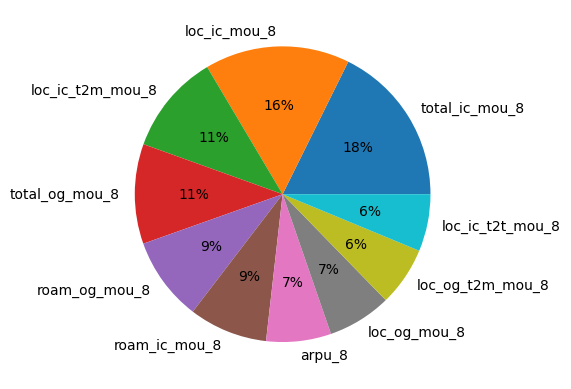

In [235]:
plt.pie(data = imP_df_sort, x = 'Imp', labels = 'Varname', autopct='%.0f%%')
plt.show()

> May be company should focus on the people with Local calls - within same telecom circle